In [1]:
# Import key packages for EDA:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as tlt
import datetime
import seaborn as sns
from pandas.plotting import autocorrelation_plot

# For geolocation data (only needed if want to run API, if 'geopy' module not found, first 2 lines install it):
import sys
!conda install --yes --prefix {sys.prefix} geopy
import geopy

# Options for pandas/matplotlib:
pd.set_option('display.max_rows', 1000)
pd.options.display.float_format = '{:,.2f}'.format
%matplotlib inline

# Used to diagnose package installation paths (get Jupyter to run same packages had locally):
#from jupyter_core.paths import jupyter_data_dir
#print(jupyter_data_dir())
#import sys
#print(sys.executable)


Solving environment: - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - 

In [2]:
# Read data from csv and set data types (dtype), except the first two columns 'DATE' and 'TIME', which
#  will be parsed later:
df = pd.read_csv("NYPD_Motor_Vehicle_Collisions.csv", dtype = {'BOROUGH':str, 'ZIP CODE':str, 'LATITUDE':float,
                'LONGITUDE':float, 'LOCATION':str, 'ON STREET NAME':str, 'CROSS STREET NAME':str, 'OFF STREET NAME':str,
                'NUMBER OF PERSONS INJURED':int, 'NUMBER OF PERSONS KILLED':int,'NUMBER OF PEDESTRIANS INJURED':int,
                'NUMBER OF PEDESTRIANS KILLED':int, 'NUMBER OF CYCLIST INJURED':int, 'NUMBER OF CYCLIST KILLED':int,
                'NUMBER OF MOTORIST INJURED':int, 'NUMBER OF MOTORIST KILLED':int,
                'CONTRIBUTING FACTOR VEHICLE 1':'category', 'CONTRIBUTING FACTOR VEHICLE 2':'category',
                'CONTRIBUTING FACTOR VEHICLE 3':'category', 'CONTRIBUTING FACTOR VEHICLE 4':'category',
                'CONTRIBUTING FACTOR VEHICLE 5':'category', 'UNIQUE KEY':object, 'VEHICLE TYPE CODE 1':'category',
                'VEHICLE TYPE CODE 2':'category', 'VEHICLE TYPE CODE 3':'category', 'VEHICLE TYPE CODE 4':'category',
                'VEHICLE TYPE CODE 5':'category'})


In [3]:
# Parse 'DATE' and 'TIME' columns to datetime:
df.DATE = pd.to_datetime(df.DATE + ' ' + df.TIME, format="%m/%d/%Y %H:%M")

# Remove 'TIME' column as 'DATE' now contains all information as a timestamp equivalent:
del df['TIME']

# Convert columns to str without spaces in lower case:
df.columns = df.columns.str.replace('\s+', '_').str.lower()


In [33]:
# Show resulting data types post initial wrangling together with first 5 entries:
print(df.dtypes)
print("")
print(df.head())


date                             datetime64[ns]
borough                                  object
zip_code                                 object
latitude                                float64
longitude                               float64
location                                 object
on_street_name                           object
cross_street_name                        object
off_street_name                          object
number_of_persons_injured                 int64
number_of_persons_killed                  int64
number_of_pedestrians_injured             int64
number_of_pedestrians_killed              int64
number_of_cyclist_injured                 int64
number_of_cyclist_killed                  int64
number_of_motorist_injured                int64
number_of_motorist_killed                 int64
contributing_factor_vehicle_1          category
contributing_factor_vehicle_2          category
contributing_factor_vehicle_3          category
contributing_factor_vehicle_4          c

In [34]:
# Size of the dataframe:
df.shape


(1385480, 28)

In [7]:
# Initial summary statistics:
df.describe()


,latitude,longitude,number_of_persons_injured,number_of_persons_killed,number_of_pedestrians_injured,number_of_pedestrians_killed,number_of_cyclist_injured,number_of_cyclist_killed,number_of_motorist_injured,number_of_motorist_killed
count,1.159119e+06,1.159119e+06,1.385480e+06,1.385480e+06,1.385480e+06,1.385480e+06,1.385480e+06,1.385480e+06,1.385480e+06,1.385480e+06
mean,4.071153e+01,-7.391044e+01,2.581012e-01,1.169270e-03,5.102492e-02,6.358807e-04,2.061524e-02,7.939487e-05,1.871452e-01,4.532725e-04
std,7.017343e-01,1.711353e+00,6.566725e-01,3.626493e-02,2.352145e-01,2.591458e-02,1.445001e-01,8.990671e-03,6.176099e-01,2.323101e-02
min,0.000000e+00,-2.013600e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,4.066865e+01,-7.397819e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,4.072277e+01,-7.393115e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,4.076724e+01,-7.386783e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
max,4.112615e+01,0.000000e+00,4.300000e+01,8.000000e+00,2.700000e+01,6.000000e+00,4.000000e+00,2.000000e+00,4.300000e+01,5.000000e+00


In [42]:
# Some info on how many null/blank:
print(df.info())
print("")
print("Null 'borough':", df.borough.isnull().sum())
print("Null 'zip_code':", df.zip_code.isnull().sum())
print("Null 'location':", df.location.isnull().sum())
print("")
print("Null 'borough' but not 'location' as imputable:", ((df.borough.isnull()) & (df.location.notna())).sum())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1385480 entries, 0 to 1385479
Data columns (total 28 columns):
date                             1385480 non-null datetime64[ns]
borough                          978730 non-null object
zip_code                         978601 non-null object
latitude                         1159119 non-null float64
longitude                        1159119 non-null float64
location                         1159119 non-null object
on_street_name                   1106500 non-null object
cross_street_name                997195 non-null object
off_street_name                  230503 non-null object
number_of_persons_injured        1385480 non-null int64
number_of_persons_killed         1385480 non-null int64
number_of_pedestrians_injured    1385480 non-null int64
number_of_pedestrians_killed     1385480 non-null int64
number_of_cyclist_injured        1385480 non-null int64
number_of_cyclist_killed         1385480 non-null int64
number_of_motorist_injured      

In [154]:
# First impute what we can locally, that is 'borough' null but 'location' populated and that same 'location'
#  occurring elsewhere together with 'borough' so we can bring in 'borough' from that other location. We
#  test for how many such cases exist first:
missing = df.location[((df.borough.isnull()) & (df.location.notna()))]
present = df.location[((df.borough.notna()) & (df.location.notna()))]
print("Locally imputable 'borough' given 'borough'-'location' match elsewhere:", missing.isin(present).sum())
print("")

# We observe there are 67,743 cases where 'borough' could be populated as it appears elsewhere in the data set
#  matching the same location. We go ahead and perform this matching keeping track of null values before and after.
#  We take advantage of the same algorithm to also populate 'zip_code', which whenever 'borough' is null it is also
#  null. 'zip_code' is null in more occasions than 'borough' overall, but for 99% of data these fields match in
#  null occurrences:
print("When is 'borough' null but 'zip_code' not:", ((df.borough.isnull()) & (df.zip_code.notna())).sum())
print("When is 'borough' null and 'zip_code' too:", ((df.borough.isnull()) & (df.zip_code.isnull())).sum())
print("")

# Performing local imputation algorithm of both 'borough' and 'zip_code' off 'location' elsewhere:
pos_adj = missing.index
loc_adj = missing.index[(missing.isin(present)==True)]
locations = df.location[loc_adj]
locations = locations.reset_index(drop=True)
sub_df = df[(df.borough.notna()) & (df.location.isin(locations))][['borough', 'zip_code', 'location']]
sub_df = sub_df.drop_duplicates()
loc_adj_borough = pd.Series([""]*len(loc_adj))
loc_adj_zip = pd.Series([""]*len(loc_adj))
for i in range(len(loc_adj)):
    temp_pos = sub_df.location[(sub_df.location==locations[i])].index[0]
    loc_adj_borough[i] = sub_df.borough[temp_pos]
    loc_adj_zip[i] = sub_df.zip_code[temp_pos]
df.borough[loc_adj] = loc_adj_borough
df.zip_code[loc_adj] = loc_adj_zip

# Diagnose results:
print("Null 'borough' post local impute:", df.borough.isnull().sum())
print("Null 'zip_code' post local impute:", df.zip_code.isnull().sum())
print("Null 'location' same as previous:", df.location.isnull().sum())


Locally imputable 'borough' given 'borough'-'location' match elsewhere: 0

When is 'borough' null but 'zip_code' not: 0
When is 'borough' null and 'zip_code' too: 339007



/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Null 'borough' post local impute: 339007
Null 'zip_code' post local impute: 339146
Null 'location' same as previous: 226361


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [239]:
# Now we turn our attention towards the remaining entries where we have a location populated but we don't have
#  the corresponding 'borough' nor 'zip_code' (we've shown how, when they do, these two tend to be missing
#  simultaneously). We first quantify how many such cases do we have with populated 'location' but no 'zip_code'
#  in place:
to_get = df.location[((df.zip_code.isnull()) & (df.location.notna()))]
print("Size of missing 'borough' where 'location' present:", to_get.size)
print("")

# We see there are 150,102 cases out of the total 339,146 zip codes that remain missing. This is almost half
#  of our missing data hence why worth importing through the 'geopy' package. We go ahead and import these,
#  first retrieving the 'zip_code' and then mapping it to the corresponding 'borough' as the sets of zip codes
#  corresponding to each 'borough' are well known (link where retreived from provided below):
#
#  Import regex package and set up up Google Maps gelocator client:
import re
from geopy.geocoders import GoogleV3
#geolocator = GoogleV3(api_key="")    # NOTE: Removed own API Key for submission after completed external data search
#
#  Subset least amount of data needed for request, that is, smaller set of unique locations with missing zip codes. This reduces
#   our search from 150,102 requests to 18,473 requests (doable in a couple of hours instead of a full day almost):
to_get_df = df[(df.zip_code.isnull()) & (df.location.notna())][['borough', 'zip_code', 'latitude', 'longitude', 'location']]
original_pos = to_get_df.index
to_get_df = to_get_df.drop_duplicates()
to_get_df = to_get_df.reset_index(drop=True)
#
#  Per query will extract easiest portion which is the zip code using regex. Fromr there will use the following zip code mapping to then
#   get the boroughs locally in our desired format (https://www.health.ny.gov/statistics/cancer/registry/appendix/neighborhoods.htm):
BRONX_zip = (10453, 10457, 10460, 10458, 10467, 10468, 10451, 10452, 10456, 10454, 10455, 10459, 10474, 10463, \
             10471, 10466, 10469, 10470, 10475, 10461, 10462, 10464, 10465, 10472, 10473)
BROOKLYN_zip = (11212, 11213, 11216, 11233, 11238, 11209, 11214, 11228, 11204, 11218, 11219, 11230, 11234, 11236, 11239, 11223, 11224, \
                11229, 11235, 11201, 11205, 11215, 11217, 11231, 11203, 11210, 11225, 11226, 11207, 11208, 11211, 11222, 11220, 11232, \
                11206, 11221, 11237, 11249)
MANHATTAN_zip = (10026, 10027, 10030, 10037, 10039, 10001, 10011, 10018, 10019, 10020, 10036, 10029, 10035, 10010, 10016, 10017, 10022, \
                 10012, 10013, 10014, 10004, 10005, 10006, 10007, 10038, 10280, 10002, 10003, 10009, 10021, 10028, 10044, 10065, 10075, \
                 10128, 10023, 10024, 10025, 10031, 10032, 10033, 10034, 10040)
QUEENS_zip = (11361, 11362, 11363, 11364, 11354, 11355, 11356, 11357, 11358, 11359, 11360, 11365, 11366, 11367, 11412, 11423, 11432, 11433, \
              11434, 11435, 11436, 11101, 11102, 11103, 11104, 11105, 11106, 11374, 11375, 11379, 11385, 11691, 11692, 11693, 11694, 11695, \
              11697, 11004, 11005, 11411, 11413, 11422, 11426, 11427, 11428, 11429, 11414, 11415, 11416, 11417, 11418, 11419, 11420, 11421, \
              11368, 11369, 11370, 11372, 11373, 11377, 11378)
STATEN_ISLAND_zip = {10302, 10303, 10310, 10306, 10307, 10308, 10309, 10312, 10301, 10304, 10305, 10314}
#
#  Loop through extracting 'zip_code' and mapping to corresponding 'borough' per the above. We keep track of instances where the location
#   did not retrieve a zip code for whatever reason (timeout, error, not found for example) and also when we found a zip code but could
#   not match it to the above sets (zip code outside main boroughs, for instance, York or regex picking separate number):

### ONLY ENABLE THIS BLOCK IF WANT TO RUN API ACCESS AGAIN REMEMBER API KEY ABOVE TOO ###
##
# ext_adj_borough = pd.Series([""]*len(to_get_df.location))
# ext_adj_zip = pd.Series([""]*len(to_get_df.location))
# unfound_location = []
# unmatched_zip = []
# for i in range(len(to_get_df.location)):
#     try:
#         temp_location = geolocator.reverse(str(to_get_df.latitude[i]) + ", " + str(to_get_df.longitude[i]))
#         temp_location = str(temp_location[0])
#     except:
#         unfound_location.append(to_get_df.location[i])
#         continue
#     re_zip = re.search(r'\d{5}', temp_location)
#     try:
#         got_zip = int(re_zip.group(0))
#     except AttributeError as err_notfound:
#         unfound_location.append(to_get_df.location[i])
#         continue
#     got_borough = ""
#     if got_zip in BRONX_zip:
#         got_borough = "BRONX"
#         ext_adj_borough[i] = got_borough
#     elif got_zip in BROOKLYN_zip:
#         got_borough = "BROOKLYN"
#         ext_adj_borough[i] = got_borough
#     elif got_zip in MANHATTAN_zip:
#         got_borough = "MANHATTAN"
#         ext_adj_borough[i] = got_borough
#     elif got_zip in QUEENS_zip:
#         got_borough = "QUEENS"
#         ext_adj_borough[i] = got_borough
#     elif got_zip in STATEN_ISLAND_zip:
#         got_borough = "STATEN ISLAND"
#         ext_adj_borough[i] = got_borough
#     else:
#         unmatched_zip.append(got_zip)
#     ext_adj_zip[i] = got_zip
##
### ONLY ENABLE THIS BLOCK IF WANT TO RUN API ACCESS AGAIN REMEMBER API KEY ABOVE TOO ###

#
#  Diagnosing results:
print(ext_adj_borough.head())
print("")
print(ext_adj_zip.head())
print("")
print("Unfound locations (could not retrieve zip code, count " + str(len(unfound_location)) + "):", str(unfound_location))
print("")
print("Unmatched zip codes to boroughs (count " + str(len(unmatched_zip)) + "):", str(unmatched_zip))
#print("Null 'borough' post external impute in 'to_get_df':", to_get_df.borough.isnull().sum())
#print("Null 'zip_code' post external impute in 'to_get_df':", to_get_df.zip_code.isnull().sum())
#print("Null 'location' in 'to_get_df' (should be zero):", to_get_df.location.isnull().sum())


Size of missing 'borough' where 'location' present: 150102

0           QUEENS
1           QUEENS
2            BRONX
3           QUEENS
4    STATEN ISLAND
dtype: object

0    11362
1    11368
2    10451
3    11355
4    10304
dtype: object

Unfound locations (could not retrieve zip code, count 188): ['(40.74121, -73.84277)', '(40.7422, -73.840965)', '(40.713104, -73.83375)', '(40.66095, -73.92906)', '(40.73448, -73.92243)', '(40.74285, -73.830284)', '(40.605568, -74.03118)', '(40.63056, -74.1057)', '(40.74947, -73.7564)', '(40.698544, -73.96236)', '(40.769333, -73.912445)', '(40.73549, -73.859634)', '(40.76736, -73.9371)', '(40.8746, -73.9097)', '(40.742905, -73.83932)', '(40.68576, -73.915504)', '(40.771038, -73.83413)', '(40.71582, -73.80799)', '(40.735283, -73.85984)', '(40.773327, -73.76503)', '(40.695995, -73.96742)', '(40.856743, -73.917625)', '(40.85206, -73.82664)', '(40.74197, -73.84116)', '(40.584003, -73.92157)', '(40.7712, -73.83345)', '(40.69168, -73.99965)', '(40.82722, -7

In [247]:
# Backing up external data immediately post completion of API request:

### ONLY RUN THIS BLOCK IF WANT TO BACKUP GEOLOCATION API RESULTS POST RUN, ELSE USE PRELOADED BELOW ###
##
# external_data = pd.DataFrame(pd.concat([ext_adj_borough, ext_adj_zip, \
#                                         to_get_df.latitude, to_get_df.longitude, to_get_df.location], axis=1))
# external_data.to_csv(path_or_buf="/Users/ernesto/Documents/MIDS Berkeley/01. W200 Python/Project 2/external_data.csv")
##
### ONLY RUN THIS BLOCK IF WANT TO BACKUP GEOLOCATION API RESULTS POST RUN, ELSE USE PRELOADED BELOW ###

# If already backed up API results as 'external_data.csv' within same file path can import as follows (effectively
#  skipping the API request portion for efficiency):
external_pre = pd.read_csv("external_data.csv", dtype = {'0':str, '1':str, 'latitude':float, \
                                                          'longitude':float, 'location':str})
external_pre.columns = ['count', 'borough', 'zip_code', 'latitude', 'longitude', 'location']
external_pre = external_pre.drop(['count'], axis=1)
print(external_pre.head())
print("")
print(external_data.head())


         borough zip_code   latitude  longitude                location
0         QUEENS    11362  40.762720 -73.728170   (40.76272, -73.72817)
1         QUEENS    11368  40.737682 -73.852060  (40.737682, -73.85206)
2          BRONX    10451  40.811750 -73.931440   (40.81175, -73.93144)
3         QUEENS    11355  40.743150 -73.831924  (40.74315, -73.831924)
4  STATEN ISLAND    10304  40.610256 -74.097300   (40.610256, -74.0973)

               0      1   latitude  longitude                location
0         QUEENS  11362  40.762720 -73.728170   (40.76272, -73.72817)
1         QUEENS  11368  40.737682 -73.852060  (40.737682, -73.85206)
2          BRONX  10451  40.811750 -73.931440   (40.81175, -73.93144)
3         QUEENS  11355  40.743150 -73.831924  (40.74315, -73.831924)
4  STATEN ISLAND  10304  40.610256 -74.097300   (40.610256, -74.0973)


In [255]:
# Now that we have a sustainable way to access the data we had to pull externally, we can go back to our original
#  data set and impute what corresponds based off the API pull. As a remainder we start listing our null values
#  pre algorithm and then re-list post to diagnose how many of the ~150k missing zip codes when do have location
#  were actually able to be imputed. As shown above, some zip codes were not found or were not able to be matched
#  to the borough. In these cases we won't be able to impute, but this should provide a meaningful improvement with
#  regards to data completion anyway:

### RUN THIS IF GOING OFF API, ELSE IF PRELOADED ABOVE NO NEED ###
##
# external_pre = external_data
##
### RUN THIS IF GOING OFF API, ELSE IF PRELOADED ABOVE NO NEED ###

print("[A] Zip codes still missing post API access:", \
      external_pre.zip_code.isnull().sum())
print("[B] Boroughs missing both when zip code unaccessed but also when unmatched:", \
      external_pre.borough.isnull().sum())
print("[B-A] Boroughs missing purely do due zip code non-match:", \
      external_pre.borough.isnull().sum()-external_pre.zip_code.isnull().sum())
print("")
print("Original data frame:")
print("  Null 'borough' pre external impute:", df.borough.isnull().sum())
print("  Null 'zip_code' pre external impute:", df.zip_code.isnull().sum())
print("  Null 'location' same as previous:", df.location.isnull().sum())
print("")
#
#  Running external impute algorithm. Remember we kept original indices where could impute potentially
#   as 'original_pos'. This will make our search algorithm more efficient, similar to what we did with local:
print("Potentially imputable (externally) 'borough'/'zip_code' entries:", str(len(original_pos)))
print("")
locations = df.location[original_pos]
locations = locations.reset_index(drop=True)
full_ext_adj_borough = pd.Series([""]*len(original_pos))
full_ext_adj_zip = pd.Series([""]*len(original_pos))
for i in range(len(original_pos)):
    temp_pos = external_pre.location[(external_pre.location==locations[i])].index[0]
    full_ext_adj_borough[i] = external_pre.borough[temp_pos]
    full_ext_adj_zip[i] = external_pre.zip_code[temp_pos]
df.borough[original_pos] = full_ext_adj_borough
df.zip_code[original_pos] = full_ext_adj_zip
#
#  Diagnosing results:
print("Original data frame:")
print("  Null 'borough' post external impute:", df.borough.isnull().sum())
print("  Null 'zip_code' post external impute:", df.zip_code.isnull().sum())
print("  Null 'location' same as previous:", df.location.isnull().sum())


[A] Zip codes still missing post API access: 188
[B] Boroughs missing both when zip code unaccessed but also when unmatched: 682
[B-A] Boroughs missing purely do due zip code non-match: 494

Original data frame:
  Null 'borough' pre external impute: 339007
  Null 'zip_code' pre external impute: 339146
  Null 'location' same as previous: 226361

Potentially imputable (externally) 'borough'/'zip_code' entries: 150102



/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Original data frame:
  Null 'borough' post external impute: 198211
  Null 'zip_code' post external impute: 192926
  Null 'location' same as previous: 226361


In [277]:
# Now that we have imputed as much as we could (both locally and externally) location-wise for reliability of
#  exploration, we proceed to save a backup data frame in order to avoid having to perform the above every
#  single time:

## ONLY RUN THIS BLOCK IF WANT TO BACKUP WRANGLED DATA SET, ELSE START FROM BELOW POST WRANGLING ###
#
# wrangled_data = df
# wrangled_data.to_csv(path_or_buf="/Users/ernesto/Documents/MIDS Berkeley/01. W200 Python/Project 2/wrangled_data.csv")
#
## ONLY RUN THIS BLOCK IF WANT TO BACKUP WRANGLED DATA SET, ELSE START FROM BELOW POST WRANGLING ###

# If already have access to the wrangled results as 'wrangled_data.csv' within same file path can import
#  as follows (effectively skipping data wrangling portion of code for efficiency):
wrangled_pre = pd.read_csv("wrangled_data.csv",
                           dtype = {'borough':str, 'zip_code':str, 'latitude':float, \
                                    'longitude':float, 'location':str, 'on_street_name':str, 'cross_street_name':str, \
                                    'off_street_name':str, 'number_of_persons_injured':int, \
                                    'number_of_persons_killed':int,'number_of_pedestrians_injured':int, \
                                    'number_of_pedestrians_killed':int, 'number_of_cyclist_injured':int, \
                                    'number_of_cyclist_killed':int, 'number_of_motorist_injured':int, \
                                    'number_of_motorist_killed':int, 'contributing_factor_vehicle_1':'category', \
                                    'contributing_factor_vehicle_2':'category', \
                                    'contributing_factor_vehicle_3':'category', \
                                    'contributing_factor_vehicle_4':'category', \
                                    'contributing_factor_vehicle_5':'category', 'unique_key':object, \
                                    'vehicle_type_code_1':'category', 'vehicle_type_code_2':'category', \
                                    'vehicle_type_code_3':'category', 'vehicle_type_code_4':'category', \
                                    'vehicle_type_code_5':'category'})
wrangled_pre = wrangled_pre.drop(['Unnamed: 0'], axis=1)
wrangled_pre.date = pd.to_datetime(wrangled_pre.date, format="%Y-%m-%d %H:%M:%S")
df = wrangled_pre


In [278]:
# Create a new dataframe solving typos found in 'contributing_factor_vehicle_1'
df = df.replace({'Cell Phone (hand-Held)': 'Cell Phone (hand-held)', 'Drugs (Illegal)': 'Drugs (illegal)',
                    'Illnes': 'Illness'})


## Question 1

### What borough carries the largest injuries/fatalities? Normalized by population?

Look for:
- 1.1 Absolute count of total collisions/injuries/fatalities per borough and per injured/fatality type (pedestrian/cyclist/motorist).
- 1.2 Normalized count of total collisions/injuries/fatalities per borough and per injured/fatality type (pedestrian/cyclist/motorist).


Total injured: 357594
  [A] Pedestrians injured: 70694
  [B] Cyclists injured: 28562
  [C] Motorists injured: 259286
    [A]+[B]+[C] check total injured: 358542

Total killed: 1620
  [A] Pedestrians killed: 881
  [B] Cyclists killed: 110
  [C] Motorists killed: 628
    [A]+[B]+[C] check total killed: 1619

               total_collisions  total_injured  ped_injured  cyc_injured  \
borough                                                                    
BROOKLYN                 352661         103625        21507        10209   
QUEENS                   331898          89203        14682         5022   
MANHATTAN                278104          50088        15619         7719   
BRONX                    164872          48991        10100         2404   
STATEN ISLAND             59734          14388         1943          316   
Total:                  1187269         306295        63851        25670   

               mot_injured  total_killed  ped_killed  cyc_killed  mot_killed  
boro

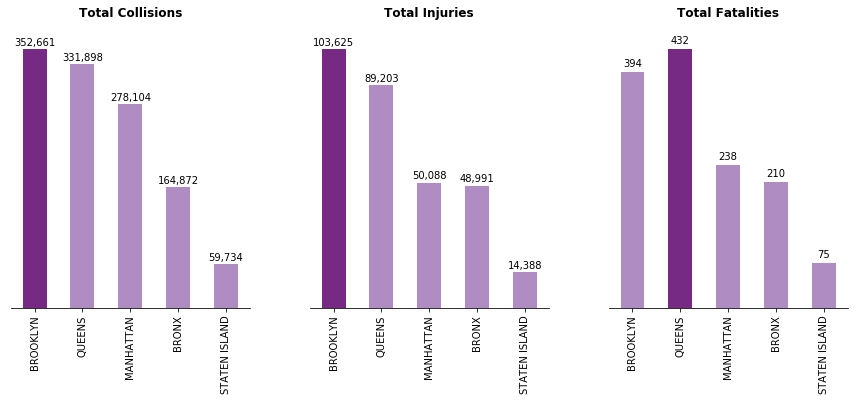

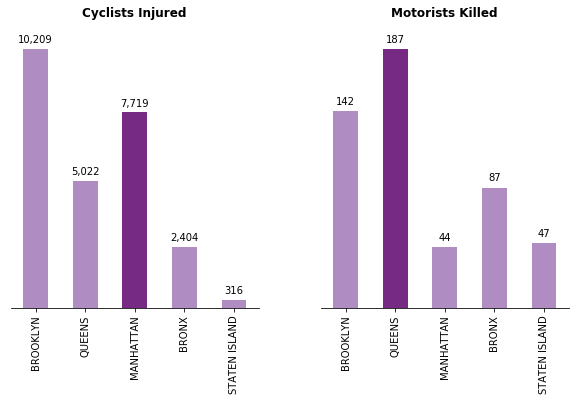

In [441]:
# 1.1 We start with an overall view of the data structure as relationships between columns accounting for
#      total injuries/fatalities and breaking these by pedestrian/cyclist/motorist:
print("Total injured:", df.number_of_persons_injured.sum())
print("  [A] Pedestrians injured:", df.number_of_pedestrians_injured.sum())
print("  [B] Cyclists injured:", df.number_of_cyclist_injured.sum())
print("  [C] Motorists injured:", df.number_of_motorist_injured.sum())
print("    [A]+[B]+[C] check total injured:", str(int(70694+28562+259286)))
print("")
print("Total killed:", df.number_of_persons_killed.sum())
print("  [A] Pedestrians killed:", df.number_of_pedestrians_killed.sum())
print("  [B] Cyclists killed:", df.number_of_cyclist_killed.sum())
print("  [C] Motorists killed:", df.number_of_motorist_killed.sum())
print("    [A]+[B]+[C] check total killed:", str(int(881+110+628)))
print("")

# Notice how total indeed adds up closely to the breakdown of the remainder three categories with small disparity
#  relative to the size of the data set (probably due to human error in accounting for injuries in particular). This
#  suggests the "total" column isn't calculated post gathering of components but probably rather input by the NYPD
#  separate from others, so it does not always add up. When it relates to the more severe outcome of a death, the
#  accounting appears much more clear in the broken out categories adding up to the total. Categories add up to
#  1,619 deaths while the total is 1,620 if based off the totals column directly.

# Next we group our data set by borough in order to inspect total collisions/injuries/fatalities and by type of 
#  individual on an absolute basis first:
borough_df = df.groupby(['borough']).agg({'borough':['count'], \
                                          'number_of_persons_injured':['sum'], \
                                          'number_of_pedestrians_injured':['sum'], \
                                          'number_of_cyclist_injured':['sum'], \
                                          'number_of_motorist_injured':['sum'], \
                                          'number_of_persons_killed':['sum'], \
                                          'number_of_pedestrians_killed':['sum'], \
                                          'number_of_cyclist_killed':['sum'], \
                                          'number_of_motorist_killed':['sum']})
borough_df.columns = ['total_collisions', \
                      'total_injured', 'ped_injured', 'cyc_injured', 'mot_injured', \
                      'total_killed', 'ped_killed', 'cyc_killed', 'mot_killed']
borough_df = borough_df.sort_values('total_collisions', ascending=False)
borough_df = borough_df.append(pd.Series(borough_df.sum(numeric_only=True), name="Total:"), ignore_index=False)
print(borough_df)
print("")

# This table answers half of our first question Q1. At the highest level Brooklyn appears as the most dangerous
#  borough or where to prioritize policy from an overall collisions and injuries perspective. Queens stands out
#  from a fatalities perspective though with more than any other borough even on less collisions than Brooklyn.
#  This is particularly true for both pedestrians and motorists with wider margin on the latter. Last, Manhattan
#  stands out as particularly dangerous when it comes to cyclist injuries. Note the different in totals with the
#  previous summary stems from untagged boroughs/zip codes/locations. We suspect these come from adjacent
#  accidents to core areas or that they are systematically distributed across boroughs otherwise, which in either
#  case leads to no major biases in our conclusions if we just focus on where we can actually tag data to a
#  specific location in the boroughs.

# The big caveat with these statistics is that these are not normalized by population of any other metric. We
#  address this issue in 1.2. However, from an overall policy perspective in terms of general impact vs. focusing
#  on drivers of normalized propensity at a more granular level, these absolute numbers would still prove helpful.

# We present some histograms showing these three initial conclusions off absolute numbers:
#
#   First figure on overall collisions, injuries and fatalities:
fig1 = plt.figure(figsize=(15,5))
#    First subplot total collisions:
ax = fig1.add_subplot(131)
y1 = borough_df.total_collisions.iloc[0:5]
y1.plot.bar(color=['#762a83', '#af8dc3', '#af8dc3', '#af8dc3', '#af8dc3'])
plt.title("Total Collisions", fontweight='semibold').set_position([.5, 1.05])
plt.xlabel("")
#ax.get_yaxis().set_major_formatter(tlt.FuncFormatter(lambda y, p: format(int(y), ',')))
ax.axes.get_yaxis().set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
for i, v in enumerate(y1):
    ax.text(i, v + 5000, format(int(float(v)), ','), ha='center', color='black', fontweight='light')
#    Second subplot total injuries:
ax2 = fig1.add_subplot(132)
y2 = borough_df.total_injured.iloc[0:5]
y2.plot.bar(color=['#762a83', '#af8dc3', '#af8dc3', '#af8dc3', '#af8dc3'])
plt.title("Total Injuries", fontweight='semibold').set_position([.5, 1.05])
plt.xlabel("")
#ax2.get_yaxis().set_major_formatter(tlt.FuncFormatter(lambda y, p: format(int(y), ',')))
ax2.axes.get_yaxis().set_visible(False)
ax2.spines['left'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
for i, v in enumerate(y2):
    ax2.text(i, v + 1650, format(int(float(v)), ','), ha='center', color='black', fontweight='light')
#    Third subplot total injuries:
ax3 = fig1.add_subplot(133)
y3 = borough_df.total_killed.iloc[0:5]
y3.plot.bar(color=['#af8dc3', '#762a83', '#af8dc3', '#af8dc3', '#af8dc3'])
plt.title("Total Fatalities", fontweight='semibold').set_position([.5, 1.05])
plt.xlabel("")
#ax3.get_yaxis().set_major_formatter(tlt.FuncFormatter(lambda y, p: format(int(y), ',')))
ax3.axes.get_yaxis().set_visible(False)
ax3.spines['left'].set_visible(False)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
for i, v in enumerate(y3):
    ax3.text(i, v + 10, format(int(float(v)), ','), ha='center', color='black', fontweight='light')
#    Subplot spacing:
plt.subplots_adjust(wspace=0.25)
#
#   Second figure on cyclists injured and motorists killed highlights:
fig2 = plt.figure(figsize=(10,5))
#    First subplot cyclists injured:
axx = fig2.add_subplot(121)
yy1 = borough_df.cyc_injured.iloc[0:5]
yy1.plot.bar(color=['#af8dc3', '#af8dc3', '#762a83', '#af8dc3', '#af8dc3'])
plt.title("Cyclists Injured", fontweight='semibold').set_position([.5, 1.05])
plt.xlabel("")
#axx.get_yaxis().set_major_formatter(tlt.FuncFormatter(lambda y, p: format(int(y), ',')))
axx.axes.get_yaxis().set_visible(False)
axx.spines['left'].set_visible(False)
axx.spines['top'].set_visible(False)
axx.spines['right'].set_visible(False)
for i, v in enumerate(yy1):
    axx.text(i, v + 250, format(int(float(v)), ','), ha='center', color='black', fontweight='light')
#    Second subplot motorists killed:
axx2 = fig2.add_subplot(122)
yy2 = borough_df.mot_killed.iloc[0:5]
yy2.plot.bar(color=['#af8dc3', '#762a83', '#af8dc3', '#af8dc3', '#af8dc3'])
plt.title("Motorists Killed", fontweight='semibold').set_position([.5, 1.05])
plt.xlabel("")
#axx2.get_yaxis().set_major_formatter(tlt.FuncFormatter(lambda y, p: format(int(y), ',')))
axx2.axes.get_yaxis().set_visible(False)
axx2.spines['left'].set_visible(False)
axx2.spines['top'].set_visible(False)
axx2.spines['right'].set_visible(False)
for i, v in enumerate(yy2):
    axx2.text(i, v + 5, format(int(float(v)), ','), ha='center', color='black', fontweight='light')
#    Subplot spacing:
plt.subplots_adjust(wspace=0.25)


In [467]:
# 1.2 The quantities in 1.1 are absolute numbers, not normalized by population or anything else. We believe that
#      it is worth taking a look at the same metrics, but normalizing by population size at least. In order to
#      do this, we looked at population data from the following source:
#
#       Population Source: https://projects.amny.com/long-island/nyc-population-estimates/
#
#      We import data pertaining total population and deaths per borough as 'raw_pop':
raw_pop = pd.read_csv("NY_Borough_Demographics.csv", dtype = {'year':int, 'desc':str, \
                                                              'brooklyn':int, 'queens':int, \
                                                              'manhattan':int, 'bronx':int, \
                                                              'staten_island':int})

# We explore our new table in case we need to extract summary metrics or do any further adjustments besides those
#  performed at import (mainly data types at import):
print(raw_pop)
print("")

# Note we have Population and Deaths per borrough on an annual basis since 2011. Our minimum observation date-wise
#  in our data frame is from July 2012, while our latest observation occurred on November 16th of 2018:
print(df.date.min())
print(df.date.max())
print("")

# Hence, when it comes to normalization by Population or an evaluation of percentage of Deaths caused by collisions,
#  we consider it most appropriate to consider data from 2011 through 2017 as our best approximation. As it
#  relates to normalizing for population, we'll use the average population per borough in this period. When we
#  try to answer what percentage of total Deaths was caused by collisions we will use the sum across these
#  years. Note we understand we're considering additional months in 2011-2012, but we also don't have 2018 data
#  from this external source, so we think this remains as a reasonable approach, just being mindful over the period
#  it covers vs. a more recent study. Additionally, as aggregate measures over entire boroughs these metrics remain
#  fairly consistent across the years. We address time-series-related inquires in future questions of this EDA.

# Normalizing by Population and summarizing in a similar fashion as we did in 1.1 above:
total_pop = raw_pop[(raw_pop.desc=='Population')].mean().drop(['year'])
total_pop.name = 'mean_pop'
print(total_pop)
print("")
total_death = raw_pop[(raw_pop.desc=='Deaths')].sum().drop(['year', 'desc'])
total_death.name = 'sum_deaths'
print(total_death)
print("")
print("Total collisions within boroughs per 100k inhabitants:", \
      "{:,.2f}".format((borough_df.total_collisions.iloc[5]/total_pop.sum())*100000))
print("")
print("Total injured within boroughs per 100k inhabitants:", \
      "{:,.2f}".format((borough_df.total_injured.iloc[5]/total_pop.sum())*100000))
print("  [A] Pedestrians injured within boroughs per 100k inhabitants:", \
      "{:,.2f}".format((borough_df.ped_injured.iloc[5]/total_pop.sum())*100000))
print("  [B] Cyclists injured within boroughs per 100k inhabitants:", \
      "{:,.2f}".format((borough_df.cyc_injured.iloc[5]/total_pop.sum())*100000))
print("  [C] Motorists injured within boroughs per 100k inhabitants:", \
      "{:,.2f}".format((borough_df.mot_injured.iloc[5]/total_pop.sum())*100000))
print("    [A]+[B]+[C] check total injured per 100k inhabitants:", "{:,.2f}".format(751.48+302.12+2560.79))
print("")
print("Total killed within boroughs per 100k inhabitants:", \
      "{:,.2f}".format((borough_df.total_killed.iloc[5]/total_pop.sum())*100000))
print("  [A] Pedestrians killed within boroughs per 100k inhabitants:", \
      "{:,.2f}".format((borough_df.ped_killed.iloc[5]/total_pop.sum())*100000))
print("  [B] Cyclists killed within boroughs per 100k inhabitants:", \
      "{:,.2f}".format((borough_df.cyc_killed.iloc[5]/total_pop.sum())*100000))
print("  [C] Motorists killed within boroughs per 100k inhabitants:", \
      "{:,.2f}".format((borough_df.mot_killed.iloc[5]/total_pop.sum())*100000))
print("    [A]+[B]+[C] check total killed per 100k inhabitants:", "{:,.2f}".format(8.79+1.12+5.97))
print("")

# Notice how the disparity between the sum of the parts and the total sum we saw on absolute terms when in comes
#  to injuries in particular continues in the same direction. However, a normalized version here gives us a sense
#  of how small it is relative to the entire data set and the associated population. Regarding deaths, again the
#  breakdown is much more precise, matching exactly on a normalized basis (it was 1 case off only in absolute
#  terms above).

# Next we take a look at what share of total deaths were cause by collision-related fatalities over our observation
#  period before:
print("Total collision-related fatalities within boroughs (pct off total deaths):", \
      "{:,.2f}".format((borough_df.total_killed.iloc[5]/total_death.sum())*100)+"%")
print("")

# Only 0.36% of total deaths are actually related to collisions within our boroughs, at least based off the data
#  at hand. To put this in perspective, we compared our statistic if 15.88 deaths per 100k inhabitants over our
#  observation period with an external source summarizing leading causes of premature death in NY counties [Source:
#  https://apps.health.ny.gov/public/tabvis/PHIG_Public/lcd/reports/#county]. Taking Kings county as the closest
#  proxy (Brooklyn, largest borough in our dataset), this number compared to 597.2 total premature deaths per 100k
#  inhabitants (15.88 / 597.2 = 2.7%). Of these 597.2, 200.8 relate to heart disease, 139.9 to cancer, 26.2 to
#  influenza, 23.4 to diabetes and 21.6 to "unintential injury". This last category is probably the most adequate
#  comparison and reasonably verifies our calculations. The difference between 2.7% and our 0.36% probably stems
#  from non-premature deaths into the mix of our other data source encompassing all deaths, that is, not only
#  premature ones as this latter source does. Overall, we don't see collision deaths as a percentage of overall
#  as guaranteeing further investigation then, but we do continue with out normalization by population to put
#  our absolute metrics from above into context.

# Now we use our same grouped data set by borough from above in order to inspect total collisions/injuries/fatalities
#  and by type of individual on a normalized basis this time. In order to do so, we must divide each column by the
#  corresponding borrough population:
print(borough_df)
print("")
total_pop = total_pop.append(pd.Series(total_pop.sum()), ignore_index=False)
total_pop.index = ['BROOKLYN', 'QUEENS', 'MANHATTAN', 'BRONX', 'STATEN ISLAND', 'Total:']
total_pop_100k = total_pop/100000
total_pop_100k.name = 'total_pop_100k'
print(total_pop_100k)
print("")
borough_df_norm = borough_df.divide(total_pop_100k, axis=0)
print(borough_df_norm)
print("")

# These normalized results show a totally different story from the absolute numbers. Again, absolute numbers are
#  still useful from a macro global policy perspective. However, if we wanted to identify other root causes
#  beyond just larger populations this normalized approach offers more granular insight. The normalized metrics
#  show that, overall, Manhattan has the largest number of collisions per 100k inhabitants. Additionally,
#  Manhattan also shows the most dangerous scenario for both pedestrians and cyclists in terms of both injuries
#  and fatalities, but it appears as much safer for motorists, most likely due to the lack of highways or higher
#  speeds within the city. On the other hand, consistent with absolute numbers above, Queens remains a standout
#  for motorist injuries and Brooklyn for overall injuries, in spite of Brooklyn now being 3rd in overall
#  collisions. Interestingly enough though, Staten Island becomes the deathliest borough for motorists even
#  surpassing Queens under this metric. Within Staten Island, its highest incidence of motorist fatalities if
#  offset by the lowest one for cyclists overall.

#[CONTINUED IN NEXT CELL FOR VISUALIZATION PURPOSES]


    year        desc  brooklyn   queens  manhattan    bronx  staten_island
0   2011  Population   2546662  2262013    1611550  1400899         471564
1   2012  Population   2579267  2284413    1630367  1417864         471593
2   2013  Population   2605783  2307766    1638790  1432881         473422
3   2014  Population   2626644  2328004    1646521  1445800         474166
4   2015  Population   2643546  2346005    1657183  1460412         475313
5   2016  Population   2650859  2356044    1662164  1468976         477383
6   2017  Population   2648771  2358582    1664727  1471160         479458
7   2011      Deaths     16109    13890      10080     8894           3324
8   2012      Deaths     15374    13822       9488     8946           3187
9   2013      Deaths     15987    14458       9889     9261           3638
10  2014      Deaths     15721    14023      10006     9165           3515
11  2015      Deaths     15654    14635      10078     9360           3682
12  2016      Deaths     

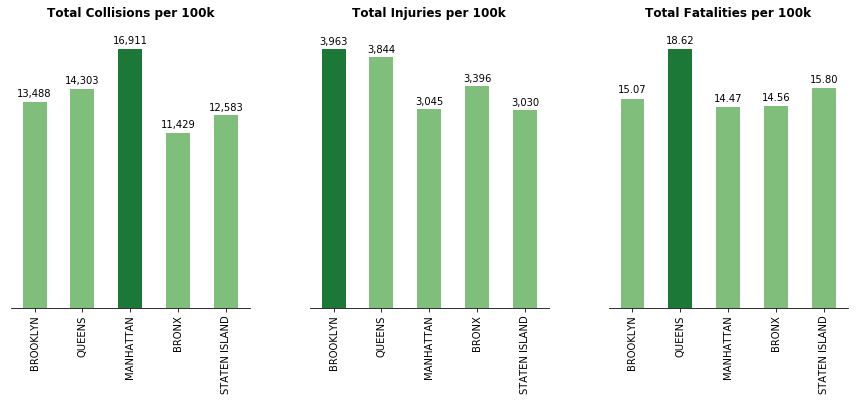

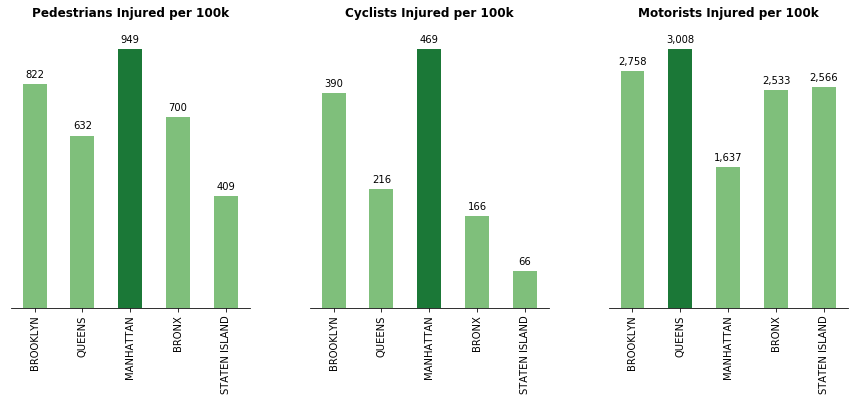

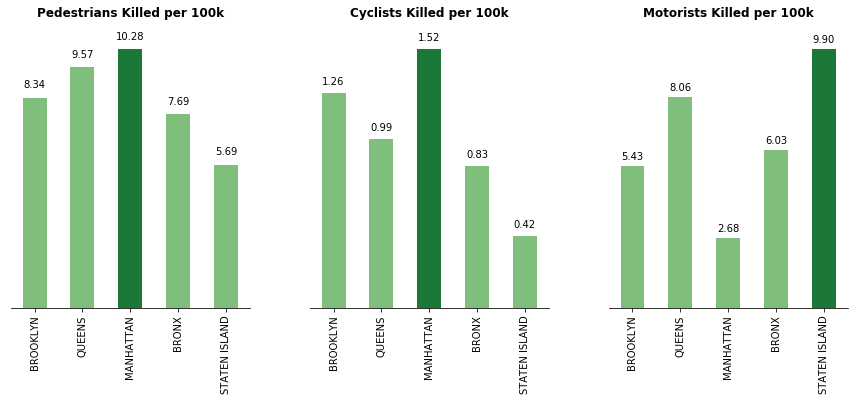

In [474]:
# We present histograms highlighting these conclusions off normalized numbers:
#
#   First figure on overall collisions, injuries and fatalities:
fig3 = plt.figure(figsize=(15,5))
#    First subplot total collisions:
bx = fig3.add_subplot(131)
z1 = borough_df_norm.total_collisions.iloc[0:5]
z1.plot.bar(color=['#7fbf7b', '#7fbf7b', '#1b7837', '#7fbf7b', '#7fbf7b'])
plt.title("Total Collisions per 100k", fontweight='semibold').set_position([.5, 1.05])
plt.xlabel("")
#bx.get_yaxis().set_major_formatter(tlt.FuncFormatter(lambda y, p: format(int(y), ',')))
bx.axes.get_yaxis().set_visible(False)
bx.spines['left'].set_visible(False)
bx.spines['top'].set_visible(False)
bx.spines['right'].set_visible(False)
for i, v in enumerate(z1):
    bx.text(i, v + 350, format(int(float(v)), ','), ha='center', color='black', fontweight='light')
#    Second subplot total injuries:
bx2 = fig3.add_subplot(132)
z2 = borough_df_norm.total_injured.iloc[0:5]
z2.plot.bar(color=['#1b7837', '#7fbf7b', '#7fbf7b', '#7fbf7b', '#7fbf7b'])
plt.title("Total Injuries per 100k", fontweight='semibold').set_position([.5, 1.05])
plt.xlabel("")
#bx2.get_yaxis().set_major_formatter(tlt.FuncFormatter(lambda y, p: format(int(y), ',')))
bx2.axes.get_yaxis().set_visible(False)
bx2.spines['left'].set_visible(False)
bx2.spines['top'].set_visible(False)
bx2.spines['right'].set_visible(False)
for i, v in enumerate(z2):
    bx2.text(i, v + 75, format(int(float(v)), ','), ha='center', color='black', fontweight='light')
#    Third subplot total injuries:
bx3 = fig3.add_subplot(133)
z3 = borough_df_norm.total_killed.iloc[0:5]
z3.plot.bar(color=['#7fbf7b', '#1b7837', '#7fbf7b', '#7fbf7b', '#7fbf7b'])
plt.title("Total Fatalities per 100k", fontweight='semibold').set_position([.5, 1.05])
plt.xlabel("")
#bx3.get_yaxis().set_major_formatter(tlt.FuncFormatter(lambda y, p: format(int(y), ',')))
bx3.axes.get_yaxis().set_visible(False)
bx3.spines['left'].set_visible(False)
bx3.spines['top'].set_visible(False)
bx3.spines['right'].set_visible(False)
for i, v in enumerate(z3):
    bx3.text(i, v + 0.4, "{:,.2f}".format(float(v), ','), ha='center', color='black', fontweight='light')
#    Subplot spacing:
plt.subplots_adjust(wspace=0.25)
#
#   Second figure on injuries per individual type highlights:
fig4 = plt.figure(figsize=(15,5))
#    First subplot pedestrians injured:
bxx = fig4.add_subplot(131)
zz1 = borough_df_norm.ped_injured.iloc[0:5]
zz1.plot.bar(color=['#7fbf7b', '#7fbf7b', '#1b7837', '#7fbf7b', '#7fbf7b'])
plt.title("Pedestrians Injured per 100k", fontweight='semibold').set_position([.5, 1.05])
plt.xlabel("")
#bxx.get_yaxis().set_major_formatter(tlt.FuncFormatter(lambda y, p: format(int(y), ',')))
bxx.axes.get_yaxis().set_visible(False)
bxx.spines['left'].set_visible(False)
bxx.spines['top'].set_visible(False)
bxx.spines['right'].set_visible(False)
for i, v in enumerate(zz1):
    bxx.text(i, v + 25, format(int(float(v)), ','), ha='center', color='black', fontweight='light')
#    Second subplot cyclists injured:
bxx2 = fig4.add_subplot(132)
zz2 = borough_df_norm.cyc_injured.iloc[0:5]
zz2.plot.bar(color=['#7fbf7b', '#7fbf7b', '#1b7837', '#7fbf7b', '#7fbf7b'])
plt.title("Cyclists Injured per 100k", fontweight='semibold').set_position([.5, 1.05])
plt.xlabel("")
#bxx2.get_yaxis().set_major_formatter(tlt.FuncFormatter(lambda y, p: format(int(y), ',')))
bxx2.axes.get_yaxis().set_visible(False)
bxx2.spines['left'].set_visible(False)
bxx2.spines['top'].set_visible(False)
bxx2.spines['right'].set_visible(False)
for i, v in enumerate(zz2):
    bxx2.text(i, v + 12, format(int(float(v)), ','), ha='center', color='black', fontweight='light')
#    Third subplot motorists injured:
bxx3 = fig4.add_subplot(133)
zz3 = borough_df_norm.mot_injured.iloc[0:5]
zz3.plot.bar(color=['#7fbf7b', '#1b7837', '#7fbf7b', '#7fbf7b', '#7fbf7b'])
plt.title("Motorists Injured per 100k", fontweight='semibold').set_position([.5, 1.05])
plt.xlabel("")
#bxx3.get_yaxis().set_major_formatter(tlt.FuncFormatter(lambda y, p: format(int(y), ',')))
bxx3.axes.get_yaxis().set_visible(False)
bxx3.spines['left'].set_visible(False)
bxx3.spines['top'].set_visible(False)
bxx3.spines['right'].set_visible(False)
for i, v in enumerate(zz3):
    bxx3.text(i, v + 75, format(int(float(v)), ','), ha='center', color='black', fontweight='light')
#    Subplot spacing:
plt.subplots_adjust(wspace=0.25)
#
#   Third figure on fatalities per individual type highlights:
fig5 = plt.figure(figsize=(15,5))
#    First subplot pedestrians killed:
bxxx = fig5.add_subplot(131)
zzz1 = borough_df_norm.ped_killed.iloc[0:5]
zzz1.plot.bar(color=['#7fbf7b', '#7fbf7b', '#1b7837', '#7fbf7b', '#7fbf7b'])
plt.title("Pedestrians Killed per 100k", fontweight='semibold').set_position([.5, 1.05])
plt.xlabel("")
#bxxx.get_yaxis().set_major_formatter(tlt.FuncFormatter(lambda y, p: format(int(y), ',')))
bxxx.axes.get_yaxis().set_visible(False)
bxxx.spines['left'].set_visible(False)
bxxx.spines['top'].set_visible(False)
bxxx.spines['right'].set_visible(False)
for i, v in enumerate(zzz1):
    bxxx.text(i, v + 0.40, "{:,.2f}".format(float(v), ','), ha='center', color='black', fontweight='light')
#    Second subplot cyclists killed:
bxxx2 = fig5.add_subplot(132)
zzz2 = borough_df_norm.cyc_killed.iloc[0:5]
zzz2.plot.bar(color=['#7fbf7b', '#7fbf7b', '#1b7837', '#7fbf7b', '#7fbf7b'])
plt.title("Cyclists Killed per 100k", fontweight='semibold').set_position([.5, 1.05])
plt.xlabel("")
#bxxx2.get_yaxis().set_major_formatter(tlt.FuncFormatter(lambda y, p: format(int(y), ',')))
bxxx2.axes.get_yaxis().set_visible(False)
bxxx2.spines['left'].set_visible(False)
bxxx2.spines['top'].set_visible(False)
bxxx2.spines['right'].set_visible(False)
for i, v in enumerate(zzz2):
    bxxx2.text(i, v + 0.05, "{:,.2f}".format(float(v), ','), ha='center', color='black', fontweight='light')
#    Third subplot motorists killed:
bxxx3 = fig5.add_subplot(133)
zzz3 = borough_df_norm.mot_killed.iloc[0:5]
zzz3.plot.bar(color=['#7fbf7b', '#7fbf7b', '#7fbf7b', '#7fbf7b', '#1b7837'])
plt.title("Motorists Killed per 100k", fontweight='semibold').set_position([.5, 1.05])
plt.xlabel("")
#bxxx3.get_yaxis().set_major_formatter(tlt.FuncFormatter(lambda y, p: format(int(y), ',')))
bxxx3.axes.get_yaxis().set_visible(False)
bxxx3.spines['left'].set_visible(False)
bxxx3.spines['top'].set_visible(False)
bxxx3.spines['right'].set_visible(False)
for i, v in enumerate(zzz3):
    bxxx3.text(i, v + 0.25, "{:,.2f}".format(float(v), ','), ha='center', color='black', fontweight='light')
#    Subplot spacing:
plt.subplots_adjust(wspace=0.25)


## Question 2

### What are the top zip codes or even particular crossings to be aware of? Can policy/adjustments on root causes (from contributing factor descriptions) be implemented on these?

Look for:
- 2.1 Top 10 zip codes based on count of total collisions/injuries/fatalities.
- 2.2 Top 10 zip codes based on count of pedestrian injuries/fatalities.
- 2.3 Top 10 zip codes based on count of cyclist injuries/fatalities.
- 2.4 Boroughs and contributing factors associated with these top zip codes, based off queries.
- 2.5 Any maps illustrating overall distribution of collisions or showing these top zip codes graphically.


In [612]:
# 2.1 We're now interested in digging a little deeper than at the borough level, through a more localized
#      approach. With in mind we consider it a natural step to delimit our coordinates to what encompasses
#      the bulk of our boroughs of interest in particular, so we group and focus on zip codes within this
#      domain. Hence, we identidy mix/max latitude and longitude of interest to subset our broader data
#      set without losing meaningful information and from then on group by zip code instead of borough
#      above in order to find what the most dangerous zip codes appear to be, at least on an absolute tally
#      basis. The official coordinates encompassing our boroughs were taken from the following source:
#
#       Official Coordinates Source:
#       https://www1.nyc.gov/assets/planning/download/pdf/data-maps/open-data/nybb_metadata.pdf?ver=18c
#
#      This points to min/max latitude of 40.50/40.92 and min/max longitude of -74.26/-73.70 for subsetting:
local_df = df[(df.latitude>=40.50) & (df.latitude<=40.92) & (df.longitude>=-74.26) & (df.longitude<=-73.70)]
zip_df = df.groupby(['zip_code']).agg({'zip_code':['count'], \
                                       'number_of_persons_injured':['sum'], \
                                       'number_of_pedestrians_injured':['sum'], \
                                       'number_of_cyclist_injured':['sum'], \
                                       'number_of_motorist_injured':['sum'], \
                                       'number_of_persons_killed':['sum'], \
                                       'number_of_pedestrians_killed':['sum'], \
                                       'number_of_cyclist_killed':['sum'], \
                                       'number_of_motorist_killed':['sum']})
zip_df.columns = ['total_collisions', \
                  'total_injured', 'ped_injured', 'cyc_injured', 'mot_injured', \
                  'total_killed', 'ped_killed', 'cyc_killed', 'mot_killed']
zip_df = zip_df.append(pd.Series(zip_df.sum(numeric_only=True), name="Total:"), ignore_index=False)
zip_df = zip_df.sort_values('total_collisions', ascending=False)
print("Sorting by total collisions:")
print(zip_df.iloc[0:11, 0])
print("")
#
# Sorting by total collisions:
# zip_code
# Total:    1192554
# 11207       19792
# 11201       17831
# 11101       16899
# 10016       14376
# 10022       14232
# 11234       14195
# 10019       14092
# 10036       13376
# 11385       13374
# 11236       13316
# Name: total_collisions, dtype: int64
#
# From a total collisions perspective, the top 3 boroughs belong to Brooklyn and Queens covering some of the larger
#  areas in NYC and touching on highways in particular. The following 2 10016 and 10022 are adjacent zip codes in
#  Manhattan, around midtown East. Zip code 11234 belongs to southern Brooklyn covering a good stretch of the Belt
#  Parkway and adjacent to the top zip code 11207. Continuing down the list 10019 and 10036 cover good portions of
#  Broadway and all of Times Square in midtown West. Last 11385 is in the heart of Brooklyn and 11236 covers yet
#  another portion of the Belt Parkway! This highway surrounds all the southern part of Brooklyn from the New
#  York Harbor to JFK.

# Now we sort by total injured and note any discrepancies. We'll first delve into total metrics and then into
#  type of indviduals involved when injured or fatal, whether pedestrians, cyclists or motorists. Sorting for
#  total injuries then:
print("Sorting by total injuries:")
zip_df = zip_df.sort_values('total_injured', ascending=False)
print(zip_df.iloc[0:11, 1])
print("")
#
# Sorting by total injuries:
# zip_code
# Total:    308148
# 11207       7276
# 11203       5207
# 11236       4879
# 11208       4506
# 11434       4393
# 11212       4210
# 11226       4128
# 11234       3865
# 11101       3707
# 11233       3676
# Name: total_injured, dtype: int64
#
# With the exception of three boroughs in the heart of Brooklyn 11212, 11226 and 11233 all other zip codes
#  touch highways and or expressways in leading total injuries at the zip code level. This would make sense
#  from the perspective that you need speed in order to get hurt as a motorist, and that total injuries/fatalities
#  are primarily composed of motorists.

# Next we sort by total fatalities and highlight any difference from previous:
print("Sorting by total fatalities:")
zip_df = zip_df.sort_values('total_killed', ascending=False)
print(zip_df.iloc[0:11, 5])
print("")
#
# Sorting by total fatalities:
# zip_code
# Total:    1364
# 11236       30
# 11207       24
# 11354       22
# 11434       21
# 11432       18
# 11229       18
# 11101       18
# 10025       17
# 10029       17
# 11206       17
# Name: total_killed, dtype: int64
#
# As it relates to actual fatalities, 11236 and 11207 come on top, both again related to the Belt Parkway on the
#  southern end of Brooklyn. Other highways also occupy top spots with 11354 covering a portion of the Whitestone
#  Expressway in Queens. 11434 covers yet another portion of the Belt Parkway, but within Queens, close to JFK.
#  The following zip codes 11101 and 11432 both cover highway portions in different parts of Queens, with the
#  latter encompassing a good portion of the Grand Central Parkway in particular. 11229 touches another portion
#  of the Belt Parkway similar to other Brooklyn zip codes. The 10025 and 10029 zip codes also tough highways,
#  but in Manhattan. The former covers a good portion of the Henry Hudson Parkway in the Western side of the
#  island while the latter a good portion of the FDR Drive on the Eastern side. What is interesting is that
#  both portions occur at exactly the same height, between 100th and 110th Streets.


Sorting by total collisions:
zip_code
Total:    1192554
11207       19792
11201       17831
11101       16899
10016       14376
10022       14232
11234       14195
10019       14092
10036       13376
11385       13374
11236       13316
Name: total_collisions, dtype: int64

Sorting by total injuries:
zip_code
Total:    308148
11207       7276
11203       5207
11236       4879
11208       4506
11434       4393
11212       4210
11226       4128
11234       3865
11101       3707
11233       3676
Name: total_injured, dtype: int64

Sorting by total fatalities:
zip_code
Total:    1364
11236       30
11207       24
11354       22
11434       21
11432       18
11229       18
11101       18
10025       17
10029       17
11206       17
Name: total_killed, dtype: int64



In [613]:
# 2.2 Next we focus on pedestrains and cyclists given most injuries/fatalities on a global basis are related
#      to motorists on highways as previously highlighted. We first analyze pedestrians in keeping with our
#      previous order:
print("Sorting by pedestrian injuries:")
zip_df = zip_df.sort_values('ped_injured', ascending=False)
print(zip_df.iloc[0:11, 2])
print("")
#
# Sorting by pedestrian injuries:
# zip_code
# Total:    63883
# 11226      1056
# 11207      1000
# 10016       917
# 11212       915
# 11213       837
# 11220       837
# 11203       826
# 10002       772
# 11208       743
# 10467       736
# Name: ped_injured, dtype: int64
#
# Pedestrian injuries appear mostly split between Manhattan and Brooklyn. One Bronx zip code does show up for
#  pedestrian injuries as 10467.

# Now we look at pedestrian fatalities:
print("Sorting by pedestrian fatalities:")
zip_df = zip_df.sort_values('ped_killed', ascending=False)
print(zip_df.iloc[0:11, 6])
print("")
#
# Sorting by pedestrian fatalities:
# zip_code
# Total:    754
# 11354      18
# 11236      15
# 11207      14
# 10025      14
# 11229      13
# 11372      13
# 10002      12
# 11214      12
# 11434      11
# 11235      11
# Name: ped_killed, dtype: int64
#
# We notice that these zip codes actually include Queens too. More broadly, pedestrian injuries appear separated
#  from fatalities actually. []


Sorting by pedestrian injuries:
zip_code
Total:    63883
11226      1056
11207      1000
10016       917
11212       915
11213       837
11220       837
11203       826
10002       772
11208       743
10467       736
Name: ped_injured, dtype: int64

Sorting by pedestrian fatalities:
zip_code
Total:    754
11354      18
11236      15
11207      14
10025      14
11372      13
11229      13
10002      12
11214      12
10022      11
11235      11
Name: ped_killed, dtype: int64



In [614]:
# 2.3 Next we focus on cyclist injurites and fatalities, in the same way we did on pedestrians first:
print("Sorting by cyclist injuries:")
zip_df = zip_df.sort_values('cyc_injured', ascending=False)
print(zip_df.iloc[0:11, 3])
print("")
#
# Sorting by cyclist injuries:
# zip_code
# Total:    25683
# 11206       636
# 11211       612
# 10002       531
# 11368       466
# 10003       459
# 11226       424
# 11221       402
# 11205       400
# 10016       396
# 11201       393
# Name: cyc_injured, dtype: int64
#
# Other than 11368 in Queens covering a good chunk of the Grand Central Parkway, most cyclist injurites remain
#  concentrated in both Brooklyn and Manhattan. We saw at an aggregate level how normalized by population this
#  issue appeared more salient in Manhattan.

# Next we look at cyclist fatalities:
print("Sorting by cyclist fatalities:")
zip_df = zip_df.sort_values('cyc_killed', ascending=False)
print(zip_df.iloc[0:11, 7])
print("")
#
# Sorting by cyclist fatalities:
# zip_code
# Total:    96
# 10029      4
# 11378      3
# 11223      3
# 10001      3
# 11221      3
# 11101      3
# 10013      2
# 10035      2
# 11218      2
# 10461      2
# Name: cyc_killed, dtype: int64
#
# Notice how Manhattan takes the top spot, but the actual number per zip_code is small. The problem, then, is more
#  widespread around Manhattan rather than a particular zip code being involved.


Sorting by cyclist injuries:
zip_code
Total:    25683
11206       636
11211       612
10002       531
11368       466
10003       459
11226       424
11221       402
11205       400
10016       396
11201       393
Name: cyc_injured, dtype: int64

Sorting by cyclist fatalities:
zip_code
Total:    96
10029      4
11378      3
11223      3
10001      3
11221      3
11101      3
10013      2
10035      2
11218      2
10461      2
Name: cyc_killed, dtype: int64



In [615]:
# 2.4 Overall, the main takeaway from the above zip code level analysis is that highways remain the main issue
#      outside Manhattan with the Belt Parkway in particular showing issues in Brooklyn. Other highways in
#      Queens appeared problematic too though, besides the continuation of the Belt Parkway into JFK. The Grand
#      Central Parkway and its adjacent Whitestone Expressway appear to pose problems for Queens.
#
#     On the other hand, for pedestrians and cyclists most issues appear concentrated in Brooklyn and Manhattan
#      in particular.


In [547]:
# 2.5 Install package linking Python to 'leaflet.js' in order to visualize maps at zip code level:
!conda install --yes --prefix {sys.prefix} folium
import folium


Solving environment: - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - 

In [632]:
# 2.5 Playing around with folium a bit, here is an interactive map of NY to put the upcoming zip-code visualizations
#      in context. Notice the highway system in particular relative to our conclusions above on motorist danger in
#      Brooklyn and Queens relative to pedestrian and cyclist ones in Manhattan:
map_nyc = folium.Map(location=[40.71, -73.93], zoom_start=11)
map_nyc


In [633]:
### Placeholder for zip code choropleth maps. We ended up generating these externally based on queries above as ###
###  Jupyter gave us an error when installing and trying to import geopandas in particular.                     ###

## Attempt with 'geopandas', 'pylab' and a joint based off geojson file for NYC:
# import geopandas as gp
# import pylab as pl
# geo_zip = gp.read_file('nyc-zip-code-tabulation-areas-polygons.geojson')
# geo_zip['postalCode'] = geo_zip['postalCode'].astype(int)
# clustered_df = pd.merge(geo_zip, zip_df, left_on='postalCode', right_on ='zip_code')
# from matplotlib import cm
# cmap = cm.get_cmap('Spectral')
# figure, ax = pl.subplots(figsize=(16,16))
# clustered_df.plot(axes=ax, column='total_collisions', legend=True, categorical=True, colormap=cmap)
# ax.set_title('Total Collisions in NYC')

## Attempt for quick map with 'folium':
# ny_geo = r'nyc-zip-code-tabulation-areas-polygons.geojson'
# folium.GeoJson(ny_geo).add_to(map_nyc)

## Attempt with choropleth function directly under 'folium' too, but now being deprecated:
# def create_nyc_map(table, zips, mapped_feature, add_text=''):
#     ny_geo = r'nyc-zip-code-tabulation-areas-polygons.geojson'
#     m = map_nyc
#     m.choropleth(
#         geo_data = ny_geo,
#         fill_opacity = 0.7,
#         line_opacity = 0.2,
#         data = table,
#         key_on = 'feature.properties.name',
#         columns = [zips, mapped_feature],
#         fill_color = "#af8dc3",
#         legend_name = (' ').join(mapped_feature.split('_')).title() + ' ' + add_text
#     )
#     folium.LayerControl().add_to(m)
#     m.save(outfile = mapped_feature + '_map.html')
# create_nyc_map(zip_df, zip_df.index, "Total Collisions")


In [631]:
# 2.5 Top street involved is Broadway:
print(local_df.on_street_name.value_counts().head())
print(local_df.cross_street_name.value_counts().head())
print(local_df.off_street_name.value_counts().head())


                                    21043
BROADWAY                            12222
ATLANTIC AVENUE                     10925
3 AVENUE                             8698
NORTHERN BOULEVARD                   8078
Name: on_street_name, dtype: int64
                                    22886
3 AVENUE                             9668
BROADWAY                             9506
2 AVENUE                             8833
5 AVENUE                             7317
Name: cross_street_name, dtype: int64
                                            47709
772       EDGEWATER ROAD                      197
110-00    ROCKAWAY BOULEVARD                  157
2800      VICTORY BOULEVARD                   118
2100      BARTOW AVENUE                        90
Name: off_street_name, dtype: int64


Minimum latitude in source data: 40.500023
Maximum latitude in source data: 40.91288400000001
Minimum longitude in source data: -74.25453159999998
Maximum longitude in source data: -73.70055

Number of data point available post location subsetting: (1158653, 28)

Any missing locations: 0
Borough untagged: 9072
Zip code unavailable: 3775



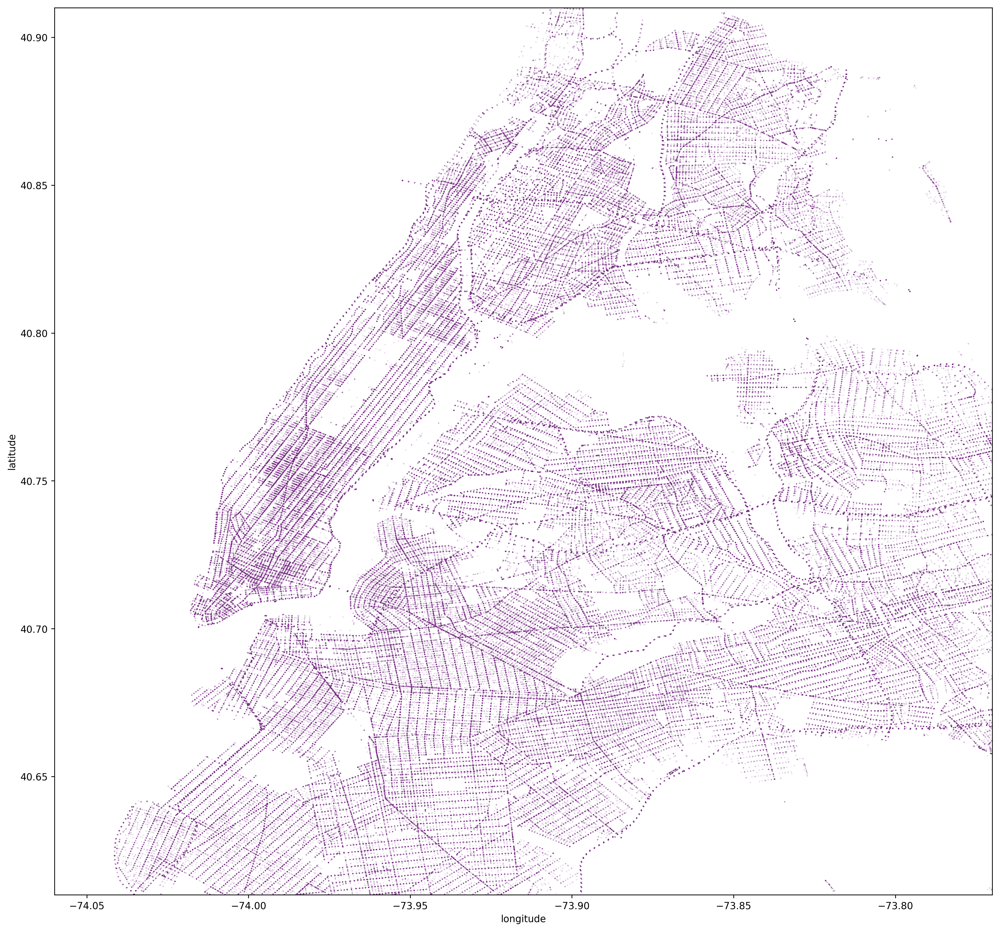

In [634]:
# 2.5 Graphical representation of overall collisions highlighting Broadway too:
#
#      First evaluate input:
print("Minimum latitude in source data:", local_df.latitude.min())
print("Maximum latitude in source data:", local_df.latitude.max())
print("Minimum longitude in source data:", local_df.longitude.min())
print("Maximum longitude in source data:", local_df.longitude.max())
print("")
print("Number of data point available post location subsetting:", local_df.shape)
print("")
print("Any missing locations:", local_df.location.isnull().sum())
print("Borough untagged:", local_df.borough.isnull().sum())
print("Zip code unavailable:", local_df.zip_code.isnull().sum())
print("")
#
#      Generate plot:
new_style = {'grid': False}
mpl.rc('axes', **new_style)  
from matplotlib import rcParams  
rcParams['figure.figsize'] = (17.5, 17)
rcParams['figure.dpi'] = 250
local_coll = local_df.plot(kind='scatter', x='longitude', y='latitude', color='#762a83', \
                           xlim=(-74.06,-73.77), ylim=(40.61, 40.91), s=.02, alpha=.6)


Number of data points: (1257, 28)



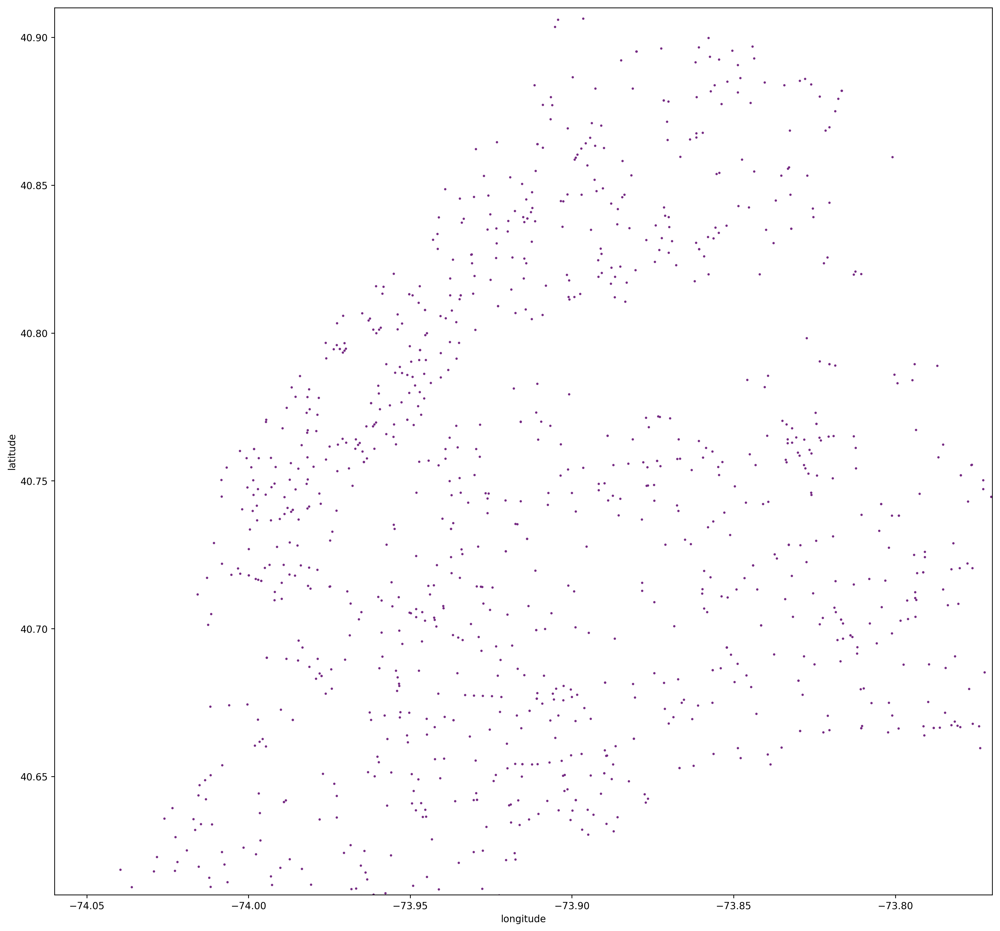

In [635]:
# 2.5 If we perform the same routine for fatalities do we get a similar output (not granular enough):
local_fatal_df = local_df[(local_df.number_of_persons_killed>0)]
print("Number of data points:", local_fatal_df.shape)
print("")
new_style = {'grid': False}
mpl.rc('axes', **new_style)  
from matplotlib import rcParams  
rcParams['figure.figsize'] = (17.5, 17)
rcParams['figure.dpi'] = 250
local_fatal = local_fatal_df.plot(kind='scatter', x='longitude', y='latitude', color='#762a83', \
                                  xlim=(-74.06,-73.77), ylim=(40.61, 40.91), s=2, alpha=1)


## Question 3

### Contributing factor and vehicle-wise, what are the most commonly identified as contributing to/involved in an accident?

Look for:
- 3.1 The most frequent contributing factor in terms of number (count) of accidents.
- 3.2 The most important contributing factor in terms of severity (highest ratio of injured per accident).
- 3.3 The most frequent contributing factor in terms of severity (highest ratio of killed per accident).


In [637]:
# List of unique contributing factor in alphabetical order.
factor_list_new = list(df.contributing_factor_vehicle_1.unique())
factor_ordered_new = []
for item in factor_list_new:
    factor_ordered_new.extend([str(item)])
for item in sorted(factor_ordered_new):
    print(item, end=", ")
print("\n\nNumber of items:", len(factor_ordered_new))


80, Accelerator Defective, Aggressive Driving/Road Rage, Alcohol Involvement, Animals Action, Backing Unsafely, Brakes Defective, Cell Phone (hand-held), Cell Phone (hands-free), Driver Inattention/Distraction, Driver Inexperience, Driverless/Runaway Vehicle, Drugs (illegal), Eating or Drinking, Failure to Keep Right, Failure to Yield Right-of-Way, Fatigued/Drowsy, Fell Asleep, Following Too Closely, Glare, Headlights Defective, Illness, Lane Marking Improper/Inadequate, Listening/Using Headphones, Lost Consciousness, Obstruction/Debris, Other Electronic Device, Other Lighting Defects, Other Vehicular, Outside Car Distraction, Oversized Vehicle, Passenger Distraction, Passing Too Closely, Passing or Lane Usage Improper, Pavement Defective, Pavement Slippery, Pedestrian/Bicyclist/Other Pedestrian Error/Confusion, Physical Disability, Prescription Medication, Reaction to Other Uninvolved Vehicle, Reaction to Uninvolved Vehicle, Shoulders Defective/Improper, Steering Failure, Texting, Tin

In [638]:
# List of unique vehicle type in alphabetical order.
vehicle_type_list = list(df.vehicle_type_code_1.unique())
vehicle_type_list_ordered = []
for item in vehicle_type_list:
    vehicle_type_list_ordered.extend([str(item)])
for item in sorted(vehicle_type_list_ordered):
    print(item, end=", ")
print("\n\nNumber of items:", len(vehicle_type_list_ordered))


(ceme, 15 Pa, 2 TON, 3-Door, 315 e, 3D, 4 dr sedan, 4DSD, 4whee, 99999, ABULA, ACCES, AM, AMABU, AMB, AMBU, AMBUL, AMBULANCE, AMbul, APORT, APPOR, AR, ARMOR, ARMY, Ambul, Ambulance, Armored Truck, BA, BACK, BACKH, BED T, BICYC, BICYCLE, BOAT, BOBCA, BOX, BOX T, BR, BS, BU, BULLD, BUS, BUs, Backh, Beverage Truck, Bike, Boom, Box, Box Truck, Box t, Bucke, Bulk Agriculture, Bus, CABIN, CAMP, CARGO, CART, CB, CHERR, CHEVY, CM, CMIX, CO, COM, COM T, COM., COMB, COMME, COMMM, CONCR, CONST, CONV, COUPE, CRANE, CUSHM, Cargo, Carry All, Cat 9, Chassis Cab, Cmix, Comix, Comm, Comme, Concrete Mixer, Convertible, DELIV, DELV, DEMA-, DIRT, DOT R, DP, DS, DUMP, DUMPT, DUNBA, Deliv, Dump, Dumps, E BIK, E ONE, E SCO, E-BIK, E-Bik, E-MOT, E/BIK, EBIKE, ELECT, EMRGN, EMS A, EMS H, EN, EPO, Elect, Enclosed Body - Removable Enclosure, FB, FD NY, FD tr, FDNY, FED E, FIRE, FIRE TRUCK, FIRET, FLAT, FLATB, FORD, FORK, FORK-, FORKL, FR, FREE, FREIG, FRONT, Fd fi, Fdny, Fire, Firet, Flat Bed, Flat Rack, Ford, F

### 3.1a The most frequent contributing factor in terms of number (count) of collisions.

In [639]:
# Group by contributing factor in vehicle_1.
by_factor = df.groupby('contributing_factor_vehicle_1')
# Calculate 
highest_count_by_factor = by_factor['number_of_persons_injured'].count().nlargest(6)


In [640]:
highest_count_by_factor = pd.DataFrame(highest_count_by_factor).reset_index() 
highest_count_by_factor.columns =['Contributing factor', 'Number of collisions']
highest_count_by_factor


,Contributing factor,Number of collisions
0,Unspecified,622353
1,Driver Inattention/Distraction,221340
2,Failure to Yield Right-of-Way,70321
3,Following Too Closely,50263
4,Fatigued/Drowsy,48697
5,Backing Unsafely,46828


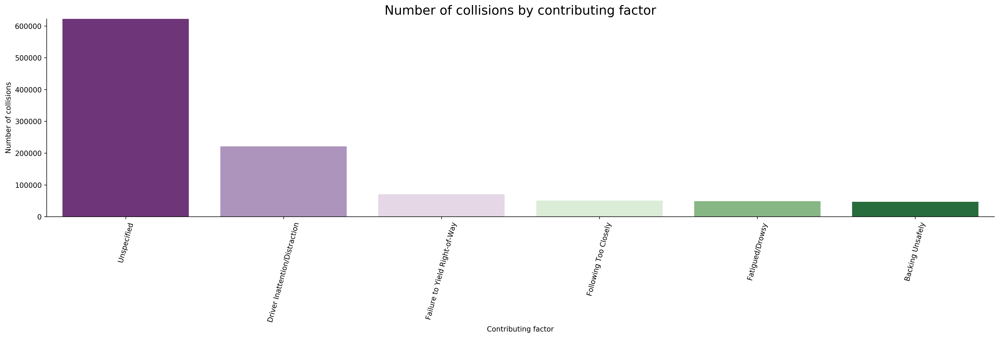

In [643]:
### Code for barplot:
my_df = highest_count_by_factor
my_x = highest_count_by_factor['Contributing factor']
my_y = highest_count_by_factor['Number of collisions']
my_labels = list(my_x)

### No need to edit here:
# Size of the plot
fig, ax = plt.subplots(figsize=(20,7))
ax.margins(x=0.0, y=0.0)
# Palette
palette = ['#762a83','#af8dc3','#e7d4e8','#d9f0d3','#7fbf7b','#1b7837']
sns.set_palette(palette)
# Remove right spine
sns.despine()
# Scale font
sns.set_context("notebook", font_scale=1.5)
# Bar plot
g = sns.barplot(x=my_x, y=my_y, data=my_df);
# Rotate xtick labels
g.set_xticklabels(rotation=75, labels=my_labels);
### end no need to edit

# Edit text in labels and title:
plt.title("Number of collisions by contributing factor");
plt.ylabel("Number of collisions");
plt.xlabel("Contributing factor");
plt.tight_layout()
# Save plot if needed 
plt.savefig("Number of collisions by contributing factor.png")


**622,353 out of 1,385,480 registered accidents do not have a specified contributing factor...that is a 44,92%, which means there is room for improvement: If the authorities care about reducing the number of accidents they need to make a bigger effort on registering the causes.**

**The first registered contributing factor is "Driver Inattention/Distraction" with a 15.98%, which is 3 times the third one "Failure to Yield Right-of-Way".**


In [645]:
# Prepare the same analysis without the Unspecified values and all bars in same color except the leading one:
highest_count_by_factor.columns =['Contributing factor', 'Number of collisions']
highest_count_by_factor = highest_count_by_factor.iloc[1:, :]
highest_count_by_factor


,Contributing factor,Number of collisions
2,Failure to Yield Right-of-Way,70321
3,Following Too Closely,50263
4,Fatigued/Drowsy,48697
5,Backing Unsafely,46828


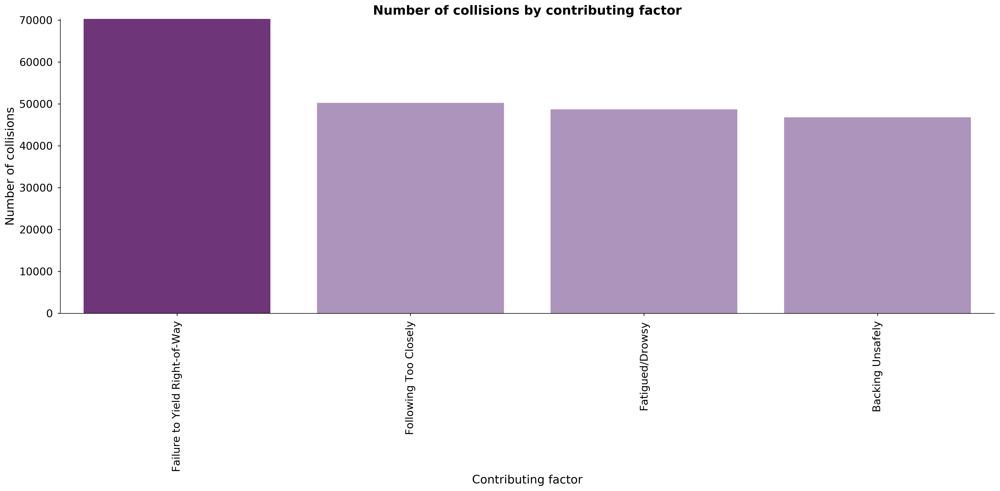

In [646]:
### Code for barplot:
my_df = highest_count_by_factor
my_x = highest_count_by_factor['Contributing factor']
my_y = highest_count_by_factor['Number of collisions']
my_labels = list(my_x)

### No need to edit here:
# Size of the plot
fig, ax = plt.subplots(figsize=(20,10))
ax.margins(x=0.0, y=0.0)
# Palette
palette = ['#762a83','#af8dc3','#af8dc3','#af8dc3','#af8dc3','#af8dc3']
sns.set_palette(palette)
# Remove right spine
sns.despine()
# Scale font
sns.set_context("notebook", font_scale=1.5)
# Bar plot
g = sns.barplot(x=my_x, y=my_y, data=my_df);
# Rotate xtick labels
g.set_xticklabels(rotation=90, labels=my_labels);
### end no need to edit

# Edit text in labels and title:
plt.title("Number of collisions by contributing factor", fontweight="bold");
plt.ylabel("Number of collisions");
plt.xlabel("Contributing factor");
plt.tight_layout()
# Save plot if needed 
plt.savefig("Number of collisions by contributing factor.png")


### 3.1b The most frequent contributing factor in terms of number of injured people.

In [647]:
# Group by contributing factor in vehicle_1.
# by_factor = df.groupby('contributing_factor_vehicle_1')
# Calculate 
highest_sum_by_factor = by_factor['number_of_persons_injured'].sum().nlargest(30)
highest_sum_by_factor = pd.DataFrame(highest_sum_by_factor).reset_index() 
highest_sum_by_factor.columns = ['Contributing factor','Number of persons injured']
highest_sum_by_factor


,Contributing factor,Number of persons injured
0,Unspecified,146862
1,Driver Inattention/Distraction,58377
2,Failure to Yield Right-of-Way,29187
3,Following Too Closely,15858
4,Fatigued/Drowsy,12605
5,Traffic Control Disregarded,11773
6,Other Vehicular,8072
7,Physical Disability,5809
8,Alcohol Involvement,5501
9,Turning Improperly,5151


**The first registered contributing factor in terms of number of injured people is also "Driver Inattention/Distraction", again followed by "Failure to Yield Right-of-Way".**


### 3.2 The most important contributing factor in terms of severity (highest ratio of persons injured per accident).


In [648]:
# Take the number_of_persons_injured in the grouped by factor dataset, calculate mean and take the n largest values:
highest_mean_by_factor = by_factor['number_of_persons_injured'].mean().nlargest(30)
highest_mean_by_factor


contributing_factor_vehicle_1
Listening/Using Headphones                              1.50
Pedestrian/Bicyclist/Other Pedestrian Error/Confusion   0.74
Drugs (illegal)                                         0.63
Physical Disability                                     0.62
Traffic Control Disregarded                             0.61
Shoulders Defective/Improper                            0.60
Unsafe Speed                                            0.60
Passenger Distraction                                   0.58
Traffic Control Device Improper/Non-Working             0.53
Cell Phone (hand-held)                                  0.49
Glare                                                   0.48
Accelerator Defective                                   0.47
Brakes Defective                                        0.47
Alcohol Involvement                                     0.46
Fell Asleep                                             0.46
Failure to Yield Right-of-Way                          

In [649]:
# Take the number_of_persons_injured in the grouped by factor dataset, calculate mean and take the n largest values:
highest_mean_and_count_by_factor = by_factor['number_of_persons_injured'].agg(['sum', 'count', 'mean'])
highest_by_factor = highest_mean_and_count_by_factor.sort_values('mean', ascending=False)
highest_by_factor_1p = highest_by_factor[highest_by_factor['sum'] > 3575]
highest_by_factor_1p.columns = ['Persons injured', 'Number of collisions', "Severity ratio"]
highest_by_factor_1p.index.names = ['Contributing factor']
highest_by_factor_1p


,Persons injured,Number of collisions,Severity ratio
Contributing factor,,,
Physical Disability,5809,9426,0.62
Traffic Control Disregarded,11773,19384,0.61
Unsafe Speed,4984,8371,0.60
Alcohol Involvement,5501,11914,0.46
Failure to Yield Right-of-Way,29187,70321,0.42
Following Too Closely,15858,50263,0.32
Pavement Slippery,3951,13618,0.29
Driver Inattention/Distraction,58377,221340,0.26
Fatigued/Drowsy,12605,48697,0.26


**The first contrinuting factor in terms of severity -"Listening/Using Headphones"- only has two registered accidents...we should filter those contributing factor which are represent than 1% of the registered ones, whatever the severity, if we are looking for potential solutions and added value information, not just statistics of the most severe.**


In [650]:
# Take the number_of_persons_injured in the grouped by factor dataset and count each of the values to get a sense of
# a distribution
by_factor['number_of_persons_injured'].value_counts().unstack()


number_of_persons_injured,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,22,24,27,32,43
contributing_factor_vehicle_1,,,,,,,,,,,,,,,,,,,,,
80,2.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Accelerator Defective,441.00,121.00,37.00,14.00,5.00,2.00,2.00,1.00,nan,1.00,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Aggressive Driving/Road Rage,"3,358.00","1,009.00",179.00,65.00,24.00,14.00,4.00,1.00,3.00,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Alcohol Involvement,"8,344.00","2,427.00",688.00,279.00,91.00,46.00,21.00,10.00,4.00,2.00,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Animals Action,726.00,95.00,24.00,2.00,1.00,nan,2.00,nan,1.00,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Backing Unsafely,"42,788.00","3,601.00",308.00,83.00,20.00,12.00,6.00,5.00,1.00,2.00,...,nan,nan,nan,nan,1.00,nan,nan,nan,nan,nan
Brakes Defective,"2,780.00",692.00,251.00,96.00,35.00,18.00,6.00,4.00,nan,nan,...,nan,nan,nan,1.00,nan,nan,nan,nan,nan,nan
Cell Phone (hand-held),196.00,49.00,22.00,6.00,2.00,2.00,1.00,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Cell Phone (hands-free),190.00,31.00,6.00,6.00,nan,1.00,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


**This information will allow a kind of distribution for 2-4 selected contributing factors.**


### 3.3 The most frequent contributing factor in terms of severity (highest ratio of persons killed per accident).


In [651]:
# Take the number_of_persons_killed in the grouped by factor dataset, calculate mean and take the n largest values
highest_killed_mean_by_factor = by_factor['number_of_persons_killed'].mean().nlargest(30)
highest_killed_mean_by_factor


contributing_factor_vehicle_1
Unsafe Speed                                            0.01
Passenger Distraction                                   0.01
Pedestrian/Bicyclist/Other Pedestrian Error/Confusion   0.01
Tow Hitch Defective                                     0.01
Drugs (illegal)                                         0.01
Traffic Control Disregarded                             0.01
Illness                                                 0.01
Alcohol Involvement                                     0.00
Physical Disability                                     0.00
Pavement Defective                                      0.00
Fell Asleep                                             0.00
Driverless/Runaway Vehicle                              0.00
View Obstructed/Limited                                 0.00
Failure to Yield Right-of-Way                           0.00
Aggressive Driving/Road Rage                            0.00
Tire Failure/Inadequate                                

In [652]:
# Take the number_of_persons_killed in the grouped by factor dataset, calculate mean and take the n largest values:
highest_killed_mean_and_count_by_factor = by_factor['number_of_persons_killed'].agg(['sum', 'count', 'mean'])
highest_killed_by_factor_1p = highest_killed_mean_and_count_by_factor[highest_killed_mean_and_count_by_factor['sum'] > 16]
highest_killed_by_factor_1p.columns = ['Persons killed', 'Number of collisions', "Severity ratio"]
highest_killed_by_factor_1p.index.names = ['Contributing factor']
highest_killed_by_factor_1p = highest_killed_by_factor_1p.sort_values('Severity ratio', ascending=False)
highest_killed_by_factor_1p


,Persons killed,Number of collisions,Severity ratio
Contributing factor,,,
Unsafe Speed,80,8371,0.01
Passenger Distraction,53,5845,0.01
Pedestrian/Bicyclist/Other Pedestrian Error/Confusion,29,3382,0.01
Traffic Control Disregarded,158,19384,0.01
Illness,19,2780,0.01
Alcohol Involvement,48,11914,0.00
Physical Disability,30,9426,0.00
Failure to Yield Right-of-Way,129,70321,0.00
Driver Inexperience,22,18497,0.00


In [653]:
# Take the number_of_persons_killed in the grouped by factor dataset and count each of the values to get a sense of
# a distribution:
by_factor_killed_dist = by_factor['number_of_persons_killed'].value_counts().unstack()
by_factor_killed_dist.index.names = ['Contributing factor']
by_factor_killed_dist = by_factor_killed_dist.fillna(0).astype(int)
by_factor_killed_dist


number_of_persons_killed,0,1,2,3,4,5,8
Contributing factor,,,,,,,
80,2,0,0,0,0,0,0
Accelerator Defective,624,0,0,0,0,0,0
Aggressive Driving/Road Rage,4651,7,0,0,0,0,0
Alcohol Involvement,11868,44,2,0,0,0,0
Animals Action,851,0,0,0,0,0,0
Backing Unsafely,46806,22,0,0,0,0,0
Brakes Defective,3885,0,0,0,0,0,0
Cell Phone (hand-held),278,0,0,0,0,0,0
Cell Phone (hands-free),234,0,0,0,0,0,0


In [654]:
# Merge:
by_factor_killed_global = highest_killed_by_factor_1p.merge(by_factor_killed_dist, left_index=True, right_index=True)
by_factor_killed_global


,Persons killed,Number of collisions,Severity ratio,0,1,2,3,4,5,8
Contributing factor,,,,,,,,,,
Unsafe Speed,80,8371,0.01,8298,67,5,1,0,0,0
Passenger Distraction,53,5845,0.01,5792,53,0,0,0,0,0
Pedestrian/Bicyclist/Other Pedestrian Error/Confusion,29,3382,0.01,3353,29,0,0,0,0,0
Traffic Control Disregarded,158,19384,0.01,19245,126,9,3,0,1,0
Illness,19,2780,0.01,2762,17,1,0,0,0,0
Alcohol Involvement,48,11914,0.00,11868,44,2,0,0,0,0
Physical Disability,30,9426,0.00,9396,30,0,0,0,0,0
Failure to Yield Right-of-Way,129,70321,0.00,70193,127,1,0,0,0,0
Driver Inexperience,22,18497,0.00,18478,18,0,0,1,0,0


## Question 4

From a time series perspective, is there seasonality in overall injuries/fatalities? How about
seasonality per type of injured subject (pedestrian/cyclist/motorist)? At a factor level (e.g. are
mobile phones increasingly prevalent as a reason)?


### 4.1 is there seasonality in overall injuries/fatalities? 


In [655]:
# Create a 'day' column from datetime info.
df['day'] = df.date.dt.date


In [656]:
# Group by day:
by_day = df.groupby('day').sum()

# Remove latitude and longitude, now meaningless info after groupby and sum:
by_day = by_day.iloc[:, 2:]
by_day.head()


,number_of_persons_injured,number_of_persons_killed,number_of_pedestrians_injured,number_of_pedestrians_killed,number_of_cyclist_injured,number_of_cyclist_killed,number_of_motorist_injured,number_of_motorist_killed
day,,,,,,,,
2012-07-01,166,0,30,0,9,0,127,0
2012-07-02,175,1,30,0,27,0,118,1
2012-07-03,210,1,36,0,16,0,158,1
2012-07-04,156,0,20,0,9,0,127,0
2012-07-05,138,1,28,1,14,0,96,0


In [657]:
# Sanity check. The sum of all data grouped by_day must be the same that before grouping:
by_day.sum()


number_of_persons_injured        357594
number_of_persons_killed           1620
number_of_pedestrians_injured     70694
number_of_pedestrians_killed        881
number_of_cyclist_injured         28562
number_of_cyclist_killed            110
number_of_motorist_injured       259286
number_of_motorist_killed           628
dtype: int64

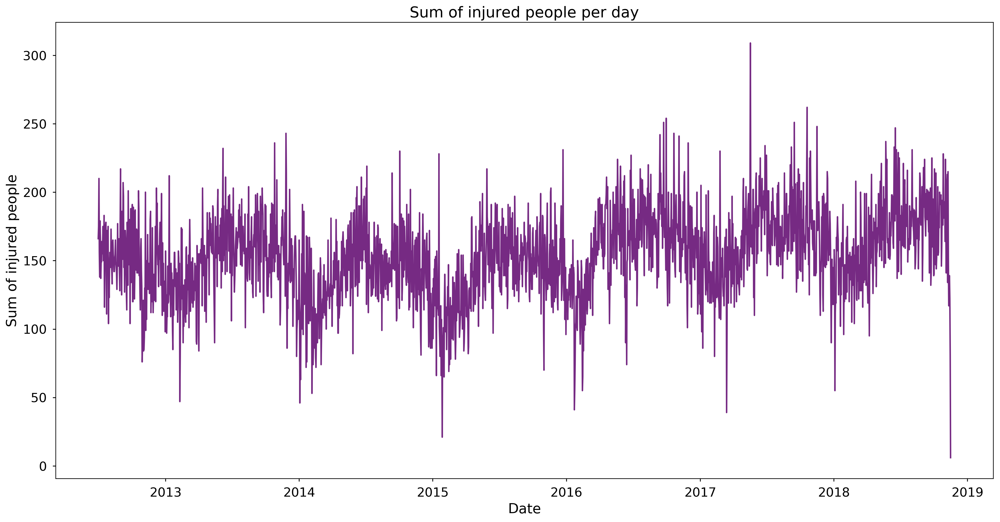

In [658]:
# Create x as the date(index):
y = by_day.number_of_persons_injured
x = y.index
# print("x", x)
# print("y", y)
# Set figure size.
fig, ax = plt.subplots(figsize=(20,10))
# Create plot:
ax.plot(x, y)
#Set title:
ax.set(title="Sum of injured people per day", xlabel="Date", ylabel="Sum of injured people")
# Show plot:
plt.show()


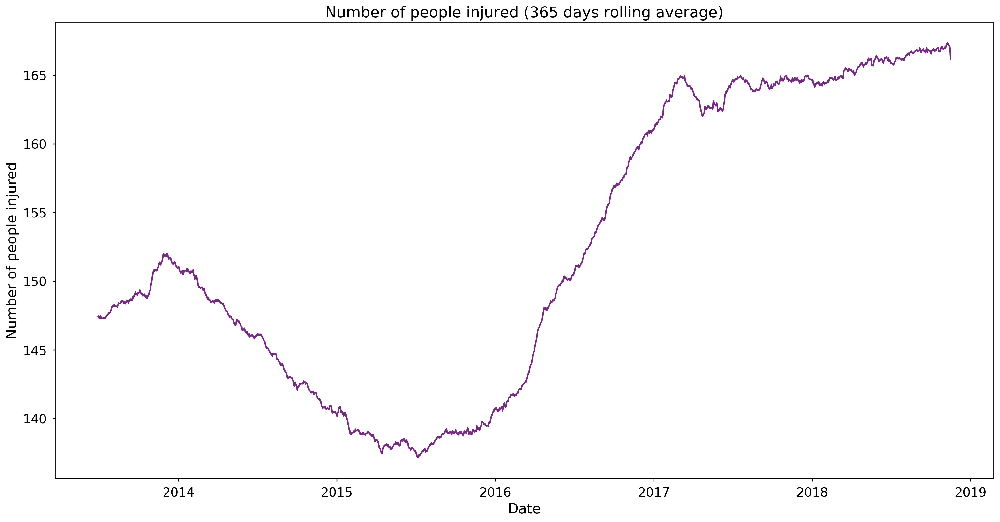

In [659]:
# People injured 365d moving average:
injured = by_day.number_of_persons_injured
y =injured.rolling(365).mean()
x = y.index
# Set figure size.
fig, ax = plt.subplots(figsize=(20,10))
# Create plot.
ax.plot(x, y)
#Set title.
ax.set(title="Number of people injured (365 days rolling average)", xlabel="Date",
       ylabel="Number of people injured")
# ax.set_ylim(0,180)
# show plot.
plt.show()


**Nice detailed plot of tendency...but the changes look bigger than they really are just because of the limits in the y axis.**

**Changing the y limits next:**
    

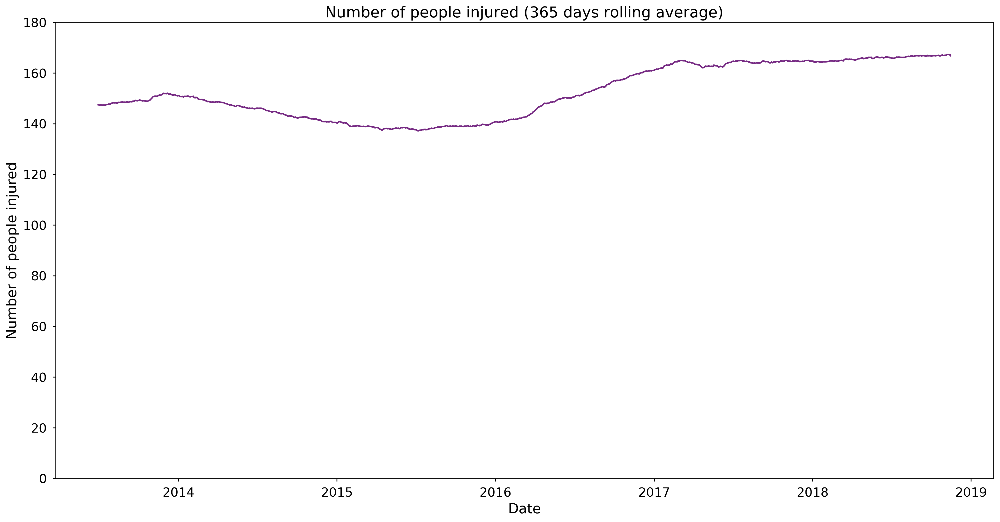

In [660]:
# Get injured people by day except last day (incomplete):
injured = by_day.number_of_persons_injured[:-1]
y =injured.rolling(365).mean()
x = y.index
# Set figure size:
fig, ax = plt.subplots(figsize=(20,10))
# Create plot:
ax.plot(x, y)
#Set title:
ax.set(title="Number of people injured (365 days rolling average)", xlabel="Date",
       ylabel="Number of people injured")
# Set y limit from 0
ax.set_ylim(0,180)
# Show plot:
plt.show()


**Same tendency calculation process for number of killed people per day**


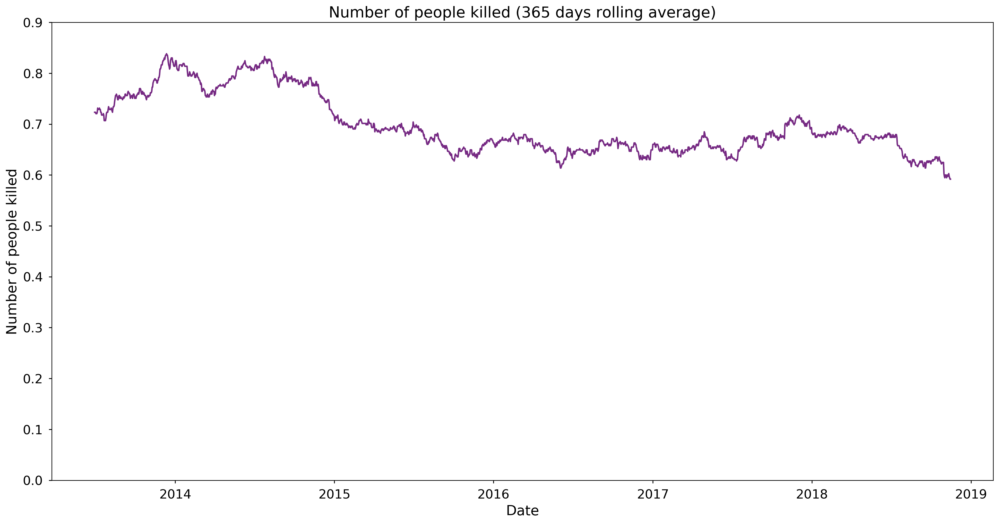

In [662]:
# Fatalities 365d moving average:
killed = by_day.number_of_persons_killed[:-1]
y =killed.rolling(365).mean()
x = y.index
# Set figure size:
fig, ax = plt.subplots(figsize=(20,10))
# Create plot:
ax.plot(x, y)
# Set title:
ax.set(title="Number of people killed (365 days rolling average)", xlabel="Date",
       ylabel="Number of people killed")
ax.set_ylim(0, 0.9)
# Show plot:
plt.show()


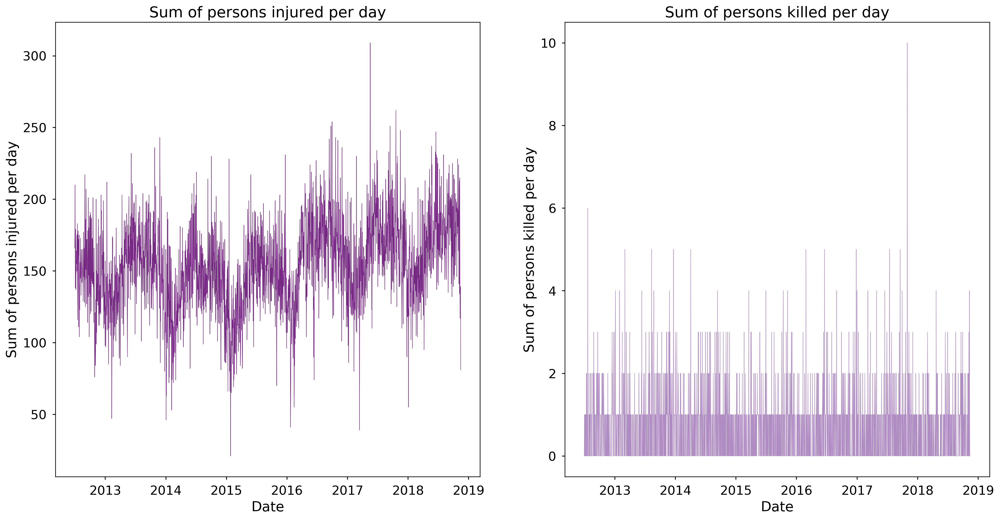

In [663]:
# Injured and killed time series in the same figure:
y1 = by_day.number_of_persons_injured[:-1]
x1 = y1.index
y2 =by_day.number_of_persons_killed[:-1]
x2 = y2.index
# Set figure size:
fig, ax = plt.subplots(figsize=(20,10), nrows=1, ncols=2)
# palette = ['#762a83','#af8dc3','#e7d4e8','#d9f0d3','#7fbf7b','#1b7837']
sns.set_palette(palette)
# Create plots:
ax[0].plot(x1, y1, linewidth=0.5, color='#762a83')
ax[1].plot(x2, y2, linewidth=0.5, color='#af8dc3')
#Set titles:
ax[0].set(title="Sum of persons injured per day", xlabel="Date", ylabel="Sum of persons injured per day")
ax[1].set(title="Sum of persons killed per day", xlabel="Date", ylabel="Sum of persons killed per day")

# Show plot:
# plt.show()
# Save plot:
plt.savefig("Sum of persons injured and killed per day.png")


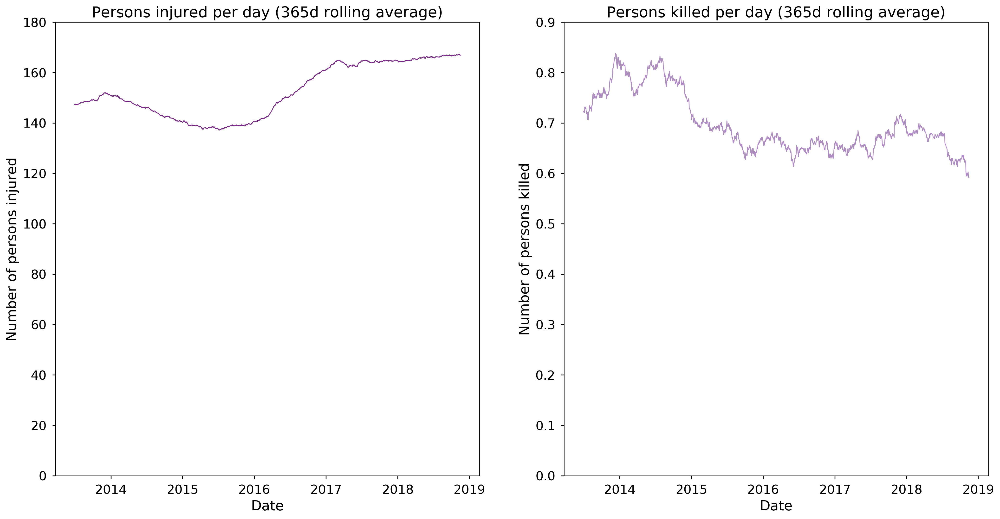

In [664]:
# Injured and killed rolling average in the same figure. Y axis starting in zero:
injured = by_day.number_of_persons_injured[:-1]
killed = by_day.number_of_persons_killed[:-1]
y1 =injured.rolling(365).mean()
x1 = y1.index
y2 =killed.rolling(365).mean()
x2 = y2.index
# Set figure size:
fig, ax = plt.subplots(figsize=(20,10), nrows=1, ncols=2)
# palette = ['#762a83','#af8dc3','#e7d4e8','#d9f0d3','#7fbf7b','#1b7837']
sns.set_palette(palette)
# Create plots:
ax[0].plot(x1, y1, linewidth=1, color='#762a83')
ax[1].plot(x2, y2, linewidth=1, color='#af8dc3')
# Set titles:
ax[0].set(title="Persons injured per day (365d rolling average)", xlabel="Date", ylabel="Number of persons injured")
ax[0].set_ylim(0,180)
ax[1].set(title="Persons killed per day (365d rolling average)", xlabel="Date",
       ylabel="Number of persons killed")
ax[1].set_ylim(0, 0.9)

# Show plot:
# plt.show()
# Save plot:
plt.savefig("Tendency of number of persons injured and killed per day.png")


**Looking for seasonality**


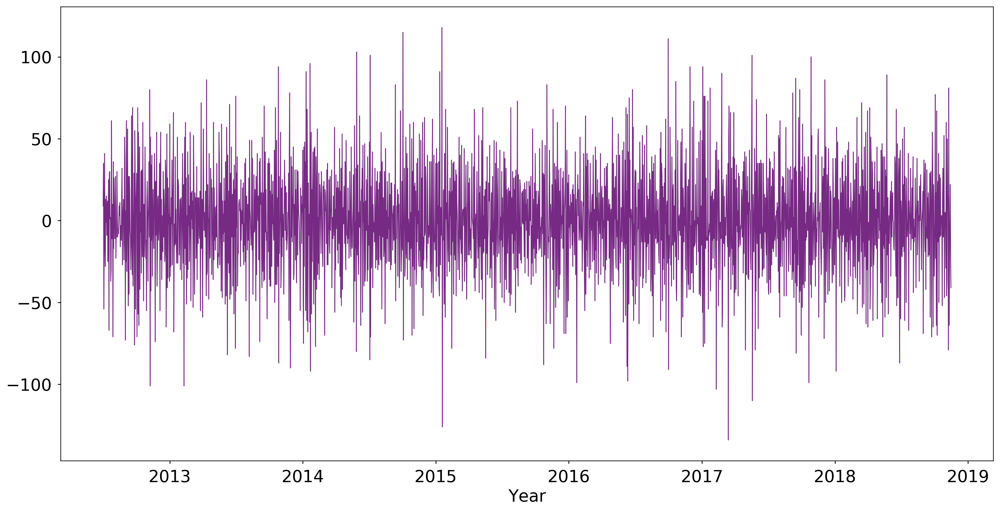

In [665]:
# Calculate and plot the first order difference:
injured.diff().plot(figsize=(20,10), linewidth=1, fontsize=20)
plt.xlabel('Year', fontsize=20);


**Too much variation on a daily basis to determine the seasonality from the plot above.**

**The approach would be to a) calculate the autocorrelation and, if found, b1) alternatives are repeat the process with monthly sum of people injured instead of daily or b2) calculate the difference between the daily sum and the 365 days rolling average to eliminate the tendency info and get the seasonality only.**


**a) Autocorrelation**


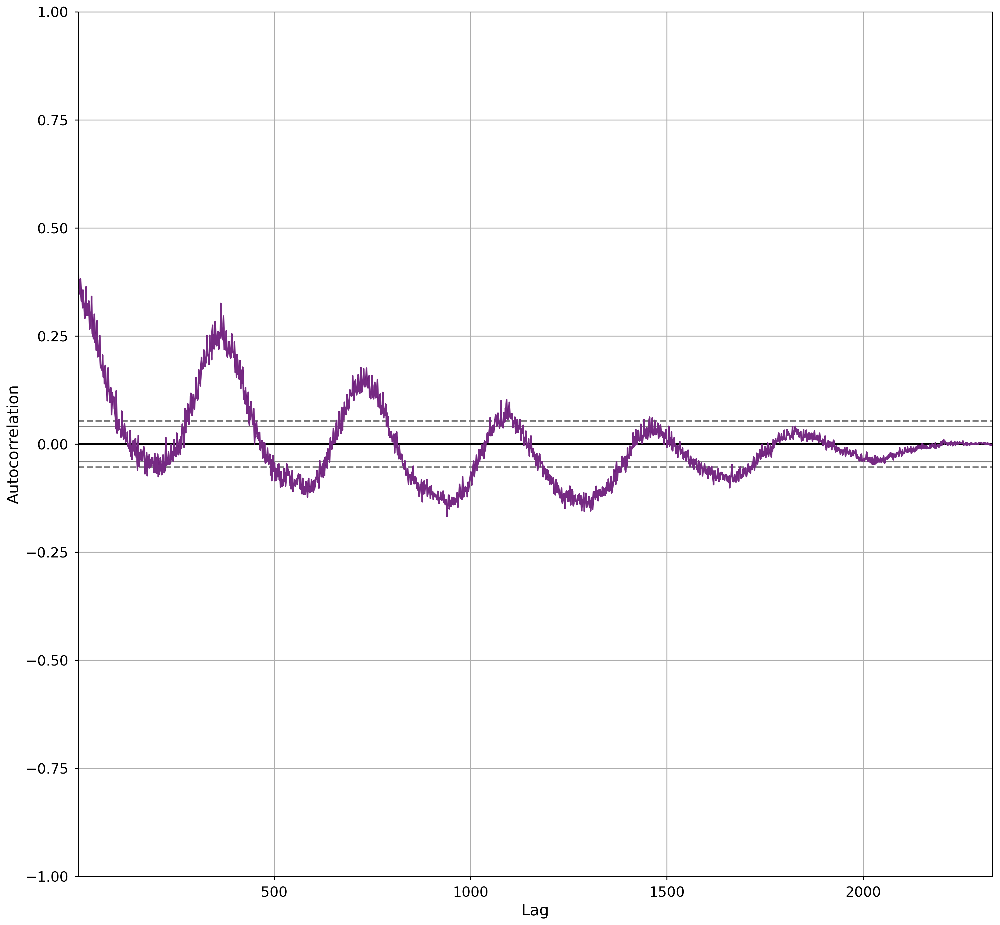

In [666]:
from pandas.plotting import autocorrelation_plot

# Create plot:
autocorrelation_plot(injured);


matplotlib.axes._subplots.AxesSubplot

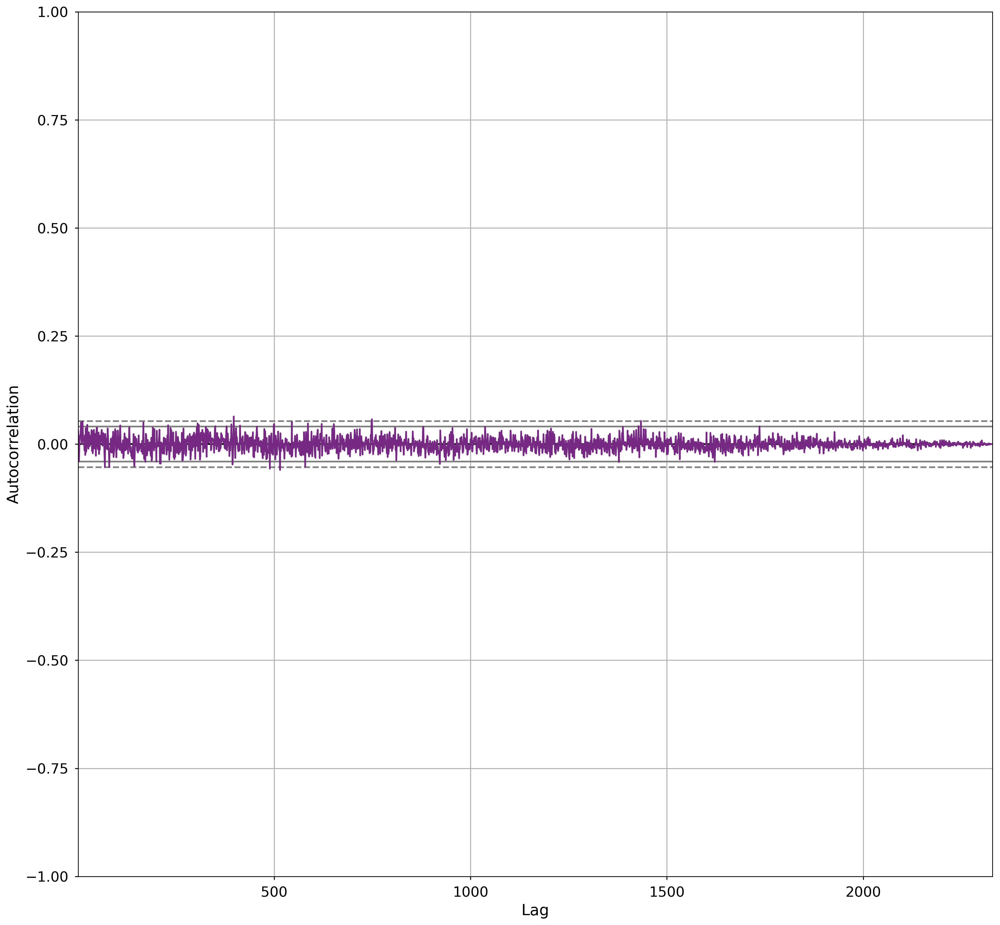

In [667]:
# Create plot:
type(autocorrelation_plot(killed))


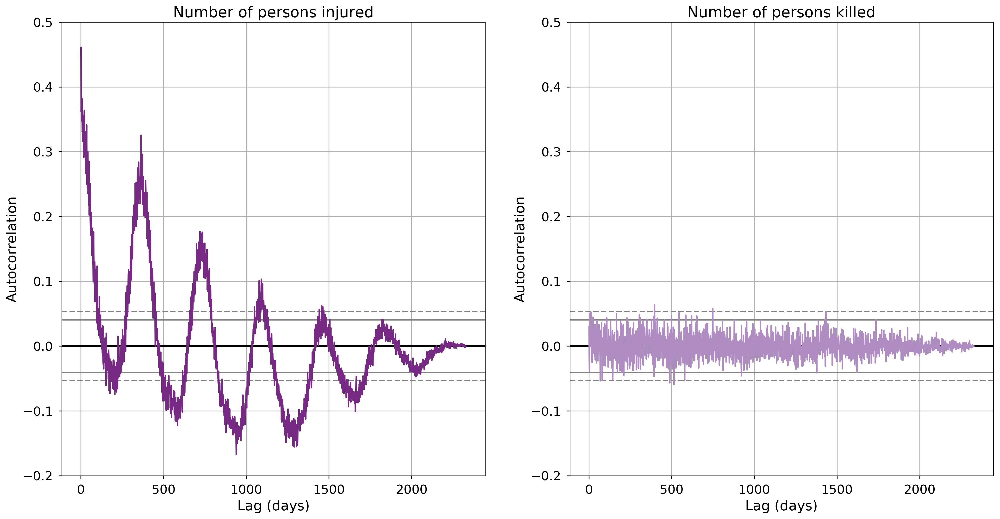

In [668]:
# Both autocorrelation plots in the same figure:
# Set figure size:
fig, ax = plt.subplots(figsize=(20,10), nrows=1, ncols=2)
# Create plot:
autocorrelation_plot(injured, ax=ax[0], color='#762a83');
autocorrelation_plot(killed, ax=ax[1], color='#af8dc3');
#Set title:
ax[0].set(title="Number of persons injured", xlabel="Lag (days)", ylabel="Autocorrelation", )
ax[1].set(title="Number of persons killed", xlabel="Lag (days)", ylabel="Autocorrelation")
ax[0].set_ylim(-0.2, 0.5)
ax[1].set_ylim(-0.2, 0.5)

# Show plot:
# plt.show()
# Save plot:
plt.savefig("Autocorrelation of persons injured and killed per day.png")


**We have found there is peak in autocorrelation of injured people every 365 days. The correlation for killed people is not significative. However, this analysis does not allow to see the seasonality in along the year.**


**b) Difference between the daily sum and the 365 days rolling average to eliminate the tendency info and get the seasonality only**


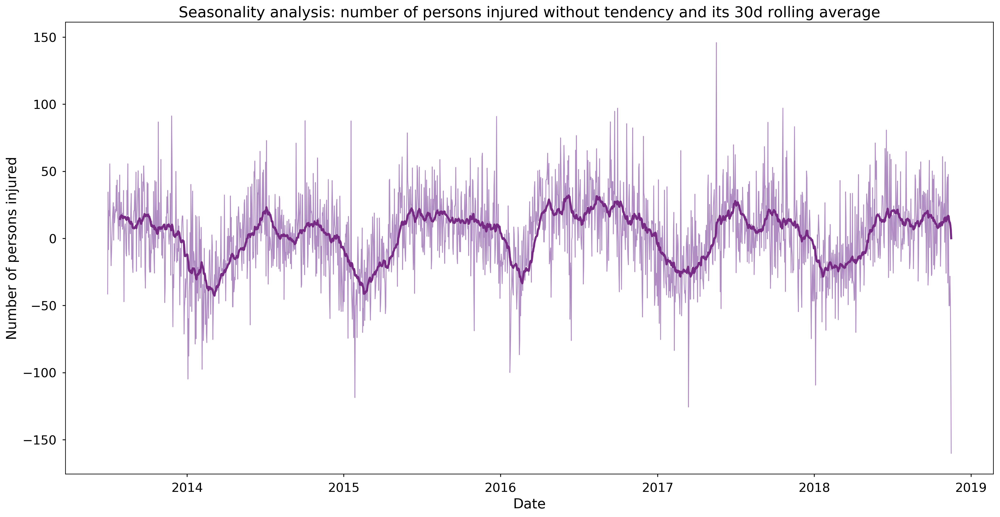

In [669]:
injured = by_day.number_of_persons_injured
# New column with injured rolling  365 days
by_day['injured_rolling365'] = injured.rolling(365).mean()
by_day['injured_without_tendency'] = by_day.number_of_persons_injured - by_day.injured_rolling365

# Make a plot
y =by_day.injured_without_tendency
y1 = by_day.injured_without_tendency.rolling(30).mean()
x = y.index
# Set figure size.
fig, ax = plt.subplots(figsize=(20,10))
# Create plot.
ax.plot(x, y, linewidth=1, color ='#af8dc3')
ax.plot(x, y1, linewidth=2.5, color='#762a83')
#Set title.
ax.set(title="Seasonality analysis: number of persons injured without tendency and its 30d rolling average", xlabel="Date",
       ylabel="Number of persons injured")
# Show plot.
# plt.show()
# Save plot
plt.savefig("Seasonality analysis.png")


**There is bigger number of injured people in late spring and autumn and lower in winter**


### 4.2 Seasonality per type of injured subject

#### 4.2.1. Pedestrians


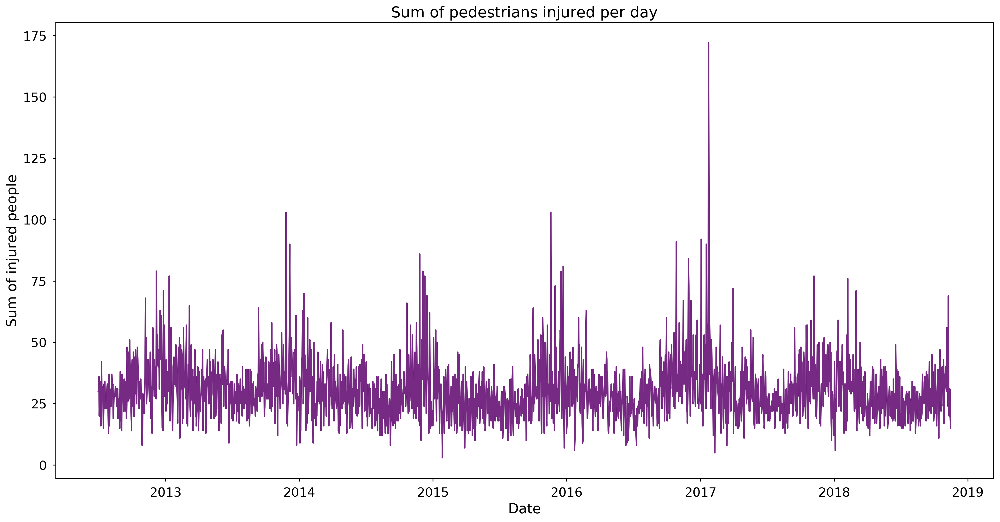

In [670]:
# Get the data:
y = by_day.number_of_pedestrians_injured[:-1]
# Create x as the date(index):
x = y.index
# print("x", x)
# print("y", y)
# Set figure size:
fig, ax = plt.subplots(figsize=(20,10))
# Create plot:
ax.plot(x, y)
# Set title:
ax.set(title="Sum of pedestrians injured per day", xlabel="Date", ylabel="Sum of injured people")
# Show plot:
plt.show()


**There is a strange peak in January 2017, aprox 170 pedestrians injured the same day...difficult to believe.**


In [671]:
# Looking for days with more than 100 pedestrians injured (strange):
by_day[by_day.number_of_pedestrians_injured >100].iloc[:, 0:8:2]


,number_of_persons_injured,number_of_pedestrians_injured,number_of_cyclist_injured,number_of_motorist_injured
day,,,,
2013-11-26,243,103,8,132
2015-11-19,200,103,9,88
2017-01-23,201,172,8,118
2017-01-24,158,111,12,116


** On January 23 and 24, figures do not sum up for type of injured... 201!=(172+8+118)**

**Looking for days in which injured do not sum up**


In [672]:
# Potential inconsistencies in summing up injuries:
by_day[by_day.number_of_persons_injured != (by_day.number_of_pedestrians_injured + by_day.number_of_cyclist_injured +
                                               by_day.number_of_motorist_injured)].iloc[:, 0:8:2]


,number_of_persons_injured,number_of_pedestrians_injured,number_of_cyclist_injured,number_of_motorist_injured
day,,,,
2012-10-15,141,41,13,86
2012-10-17,163,43,14,105
2012-10-18,141,35,11,94
2012-10-19,201,38,6,156
2012-10-21,139,23,5,109
2014-03-10,147,33,6,107
2014-03-18,121,39,6,74
2014-05-15,176,41,13,120
2014-06-28,197,45,18,133


**In 491 days the number of persons injured is not the sum of pedestrians, cyclists and motorists injured. The reason can be that "motorists" includes the owner of a parked vehicle, according to the dictionary of the database.**

**In the case of killed persons, pedestrians, cyclists and motorists:**


In [673]:
by_day[by_day.number_of_persons_killed != (by_day.number_of_pedestrians_killed + by_day.number_of_cyclist_killed +
                                               by_day.number_of_motorist_killed)].iloc[:, 1:9:2]


,number_of_persons_killed,number_of_pedestrians_killed,number_of_cyclist_killed,number_of_motorist_killed
day,,,,
2016-04-04,1,0,0,0
2016-08-27,1,0,0,0
2017-08-21,1,0,0,2


**Only three days do not sum up (by 1).**

In [674]:
# Looking for the max values:
by_day.describe()


,number_of_persons_injured,number_of_persons_killed,number_of_pedestrians_injured,number_of_pedestrians_killed,number_of_cyclist_injured,number_of_cyclist_killed,number_of_motorist_injured,number_of_motorist_killed,injured_rolling365,injured_without_tendency
count,"2,330.00","2,330.00","2,330.00","2,330.00","2,330.00","2,330.00","2,330.00","2,330.00","1,966.00","1,966.00"
mean,153.47,0.70,30.34,0.38,12.26,0.05,111.28,0.27,152.36,2.21
std,31.71,0.91,11.88,0.65,6.58,0.23,25.83,0.58,10.42,30.40
min,6.00,0.00,2.00,0.00,0.00,0.00,4.00,0.00,137.15,-160.14
25%,133.00,0.00,23.00,0.00,7.00,0.00,94.00,0.00,142.20,-17.53
50%,154.00,0.00,29.00,0.00,12.00,0.00,111.00,0.00,150.19,2.87
75%,174.00,1.00,36.00,1.00,17.00,0.00,128.00,0.00,164.28,21.47
max,309.00,10.00,172.00,8.00,37.00,2.00,233.00,5.00,167.34,145.92


**Analyzing the tendency first**


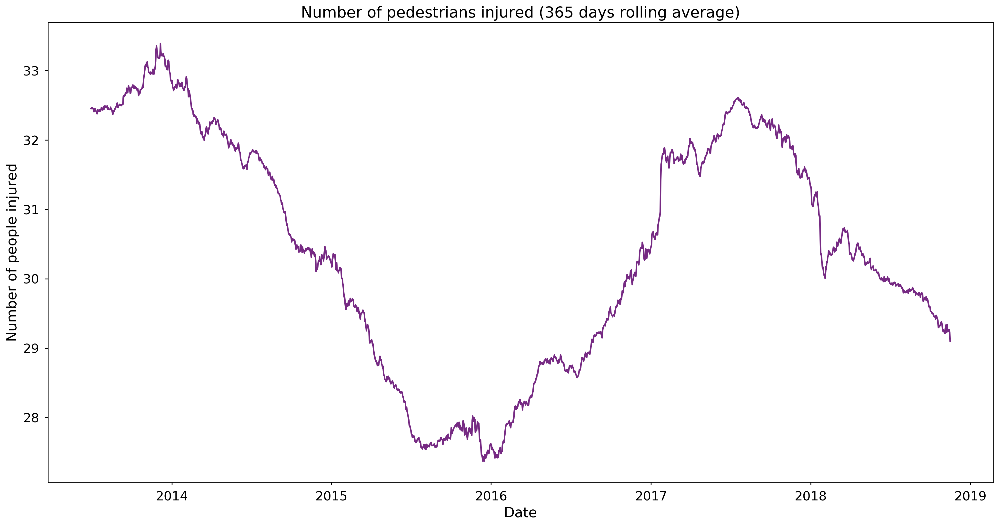

In [675]:
# Tendency analysis:
pedestrians_injured = by_day.number_of_pedestrians_injured
y =pedestrians_injured.rolling(365).mean()
x = y.index
# Set figure size:
fig, ax = plt.subplots(figsize=(20,10))
# Create plot:
ax.plot(x, y)
# Set title:
ax.set(title="Number of pedestrians injured (365 days rolling average)", xlabel="Date",
       ylabel="Number of people injured")
# ax.set_ylim(0,40)
# Show plot:
plt.show()


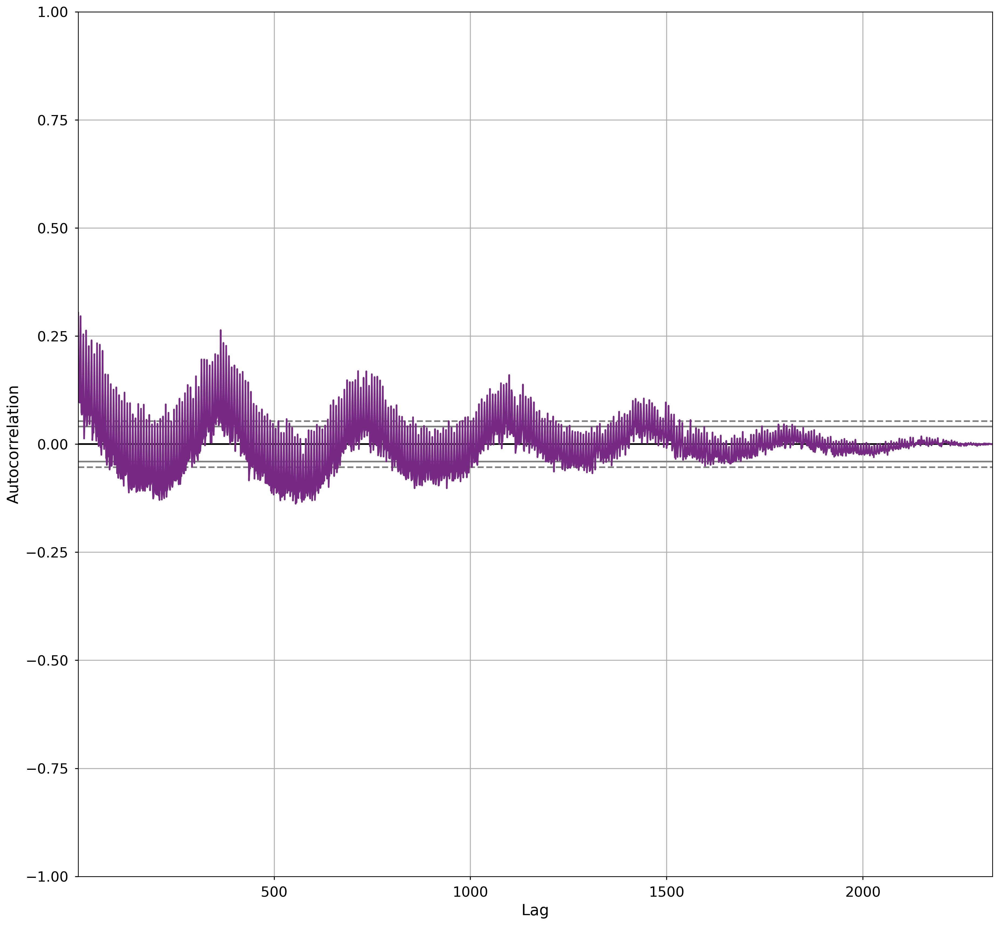

In [676]:
# Create autocorrelation plot:
autocorrelation_plot(pedestrians_injured);


#### 4.2.2 Cyclist


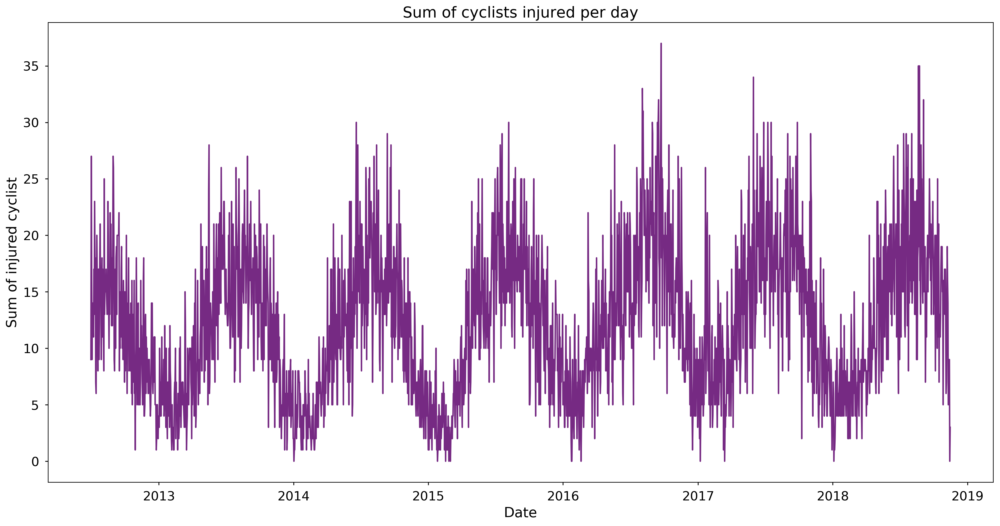

In [677]:
# Get the data:
y = by_day.number_of_cyclist_injured[:-1]
# Create x as the date(index):
x = y.index
# print("x", x)
# print("y", y)
# Set figure size:
fig, ax = plt.subplots(figsize=(20,10))
# Create plot:
ax.plot(x, y)
# Set title:
ax.set(title="Sum of cyclists injured per day", xlabel="Date", ylabel="Sum of injured cyclist")
# Show plot:
plt.show()


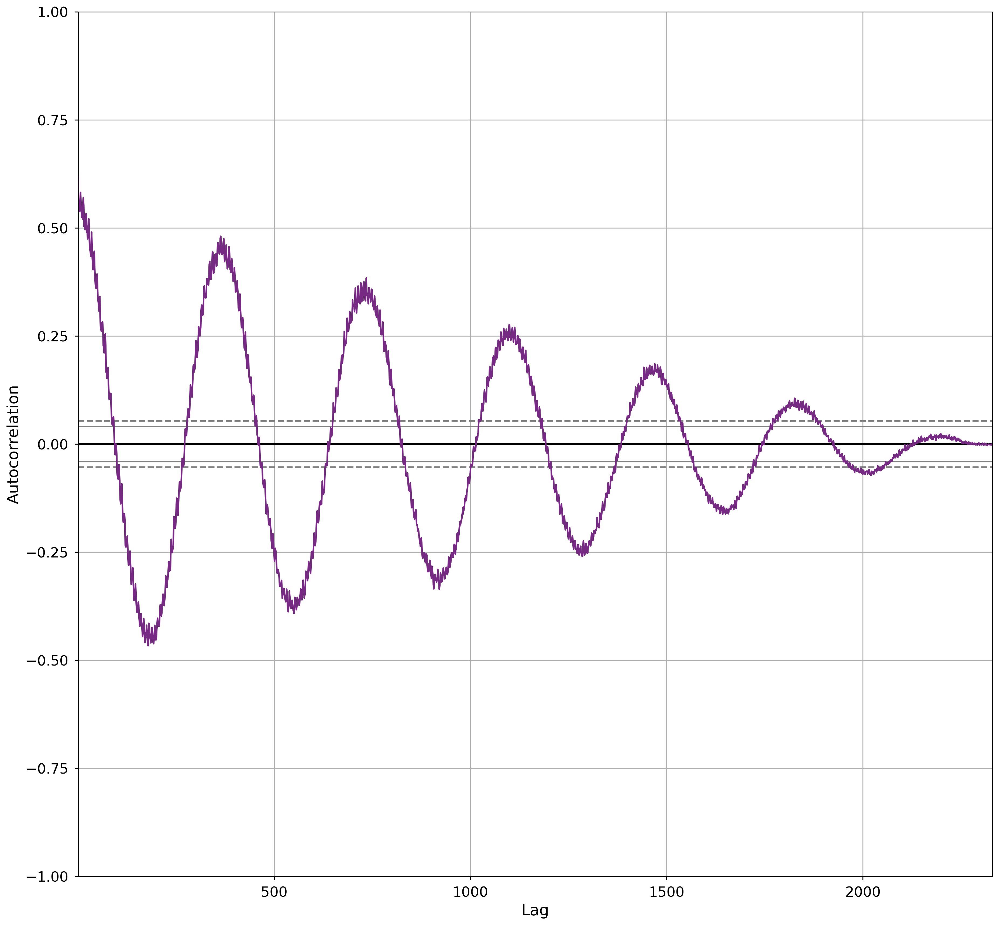

In [678]:
cyclist_injured = by_day.number_of_cyclist_injured
# Create autocorrelation plot:
autocorrelation_plot(cyclist_injured);


#### 4.2.3 Motorist


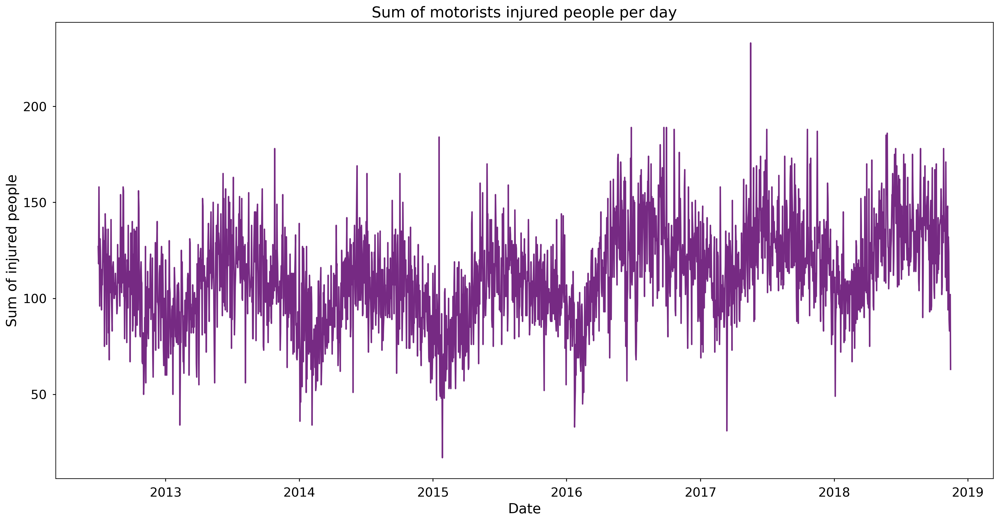

In [679]:
# Get the data:
y = by_day.number_of_motorist_injured[:-1]
# Create x as the date(index):
x = y.index
# print("x", x)
# print("y", y)
# Set figure size:
fig, ax = plt.subplots(figsize=(20,10))
# Create plot:
ax.plot(x, y)
# Set title:
ax.set(title="Sum of motorists injured people per day", xlabel="Date", ylabel="Sum of injured people")
# Show plot:
plt.show()


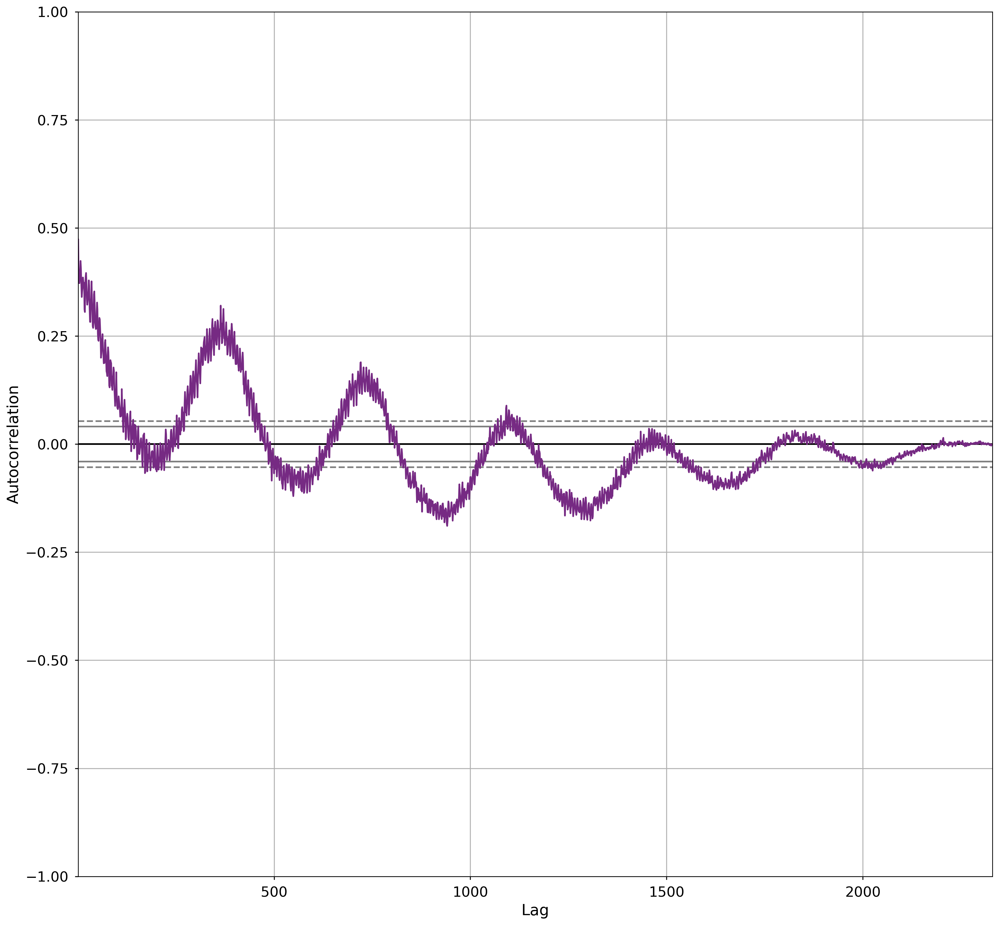

In [680]:
motorist_injured = by_day.number_of_motorist_injured
# Create autocorrelation plot:
autocorrelation_plot(motorist_injured);


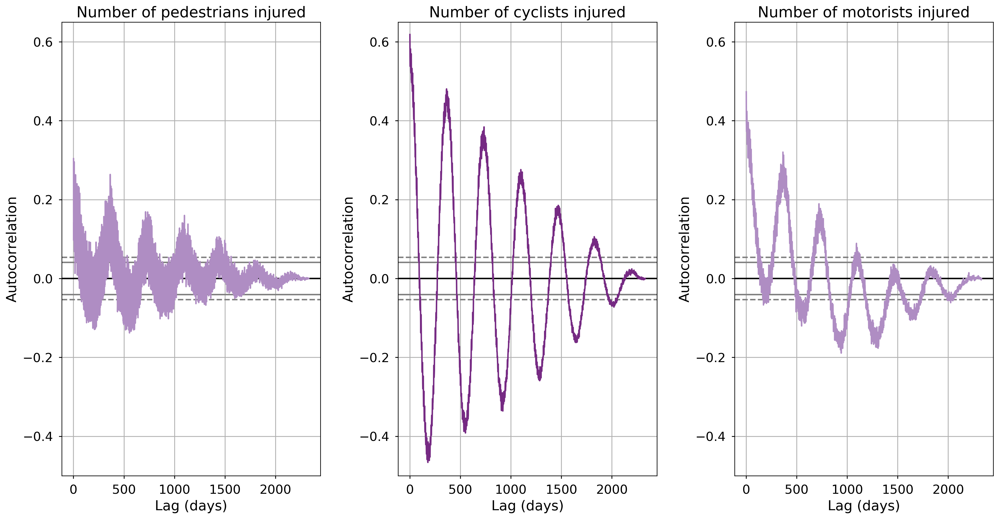

In [681]:
# Both autocorrelation plots in the same figure:
# Set figure size:
fig, ax = plt.subplots(figsize=(20,10), nrows=1, ncols=3)
fig.subplots_adjust(wspace = 0.3)

# palette = ['#762a83','#af8dc3','#e7d4e8','#d9f0d3','#7fbf7b','#1b7837']

# Create plot:
autocorrelation_plot(pedestrians_injured, ax=ax[0], color='#af8dc3');
autocorrelation_plot(cyclist_injured, ax=ax[1], color='#762a83');
autocorrelation_plot(motorist_injured, ax=ax[2], color='#af8dc3');

# Set titles:
ax[0].set(title="Number of pedestrians injured", xlabel="Lag (days)")
ax[1].set(title="Number of cyclists injured", xlabel="Lag (days)")
ax[2].set(title="Number of motorists injured", xlabel="Lag (days)")
ax[0].set_ylim(-0.5, 0.65)
ax[1].set_ylim(-0.5, 0.65)
ax[2].set_ylim(-0.5, 0.65)

# Show plot:
# plt.show()
# Save plot:
plt.savefig("Autocorrelation of pedestrians, cyclists and motorists injured per day.png")


In [636]:
import this

The Zen of Python, by Tim Peters

Beautiful is better than ugly.
Explicit is better than implicit.
Simple is better than complex.
Complex is better than complicated.
Flat is better than nested.
Sparse is better than dense.
Readability counts.
Special cases aren't special enough to break the rules.
Although practicality beats purity.
Errors should never pass silently.
Unless explicitly silenced.
In the face of ambiguity, refuse the temptation to guess.
There should be one-- and preferably only one --obvious way to do it.
Although that way may not be obvious at first unless you're Dutch.
Now is better than never.
Although never is often better than *right* now.
If the implementation is hard to explain, it's a bad idea.
If the implementation is easy to explain, it may be a good idea.
Namespaces are one honking great idea -- let's do more of those!
